In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pickle
import holidays
from scipy import stats
import xgboost as xgb
import optuna
from prophet import Prophet
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline




In [2]:
def load_model(model_path):
    model_final = None

    if os.path.exists(model_path):
        print('Model is already')

        with open(model_path, 'rb') as f:
            model_final = pickle.load(f)

    return model_final

def save_model(model, model_path):
    with open(model_path, "wb") as f:
        pickle.dump(model, f)

def calculate_mape(ytrue, yhat):
    " Calculate MAPE"
    return np.round(((np.abs(ytrue - yhat) / ytrue) * 100), 2)

def calculate_RMSE(ytrue, yhat):
    " Calculate RMSE"
    return np.round(np.sqrt(np.mean((ytrue - yhat)**2)), 2)

def calculate_MAE(ytrue, yhat):
    " Calculate MAE"
    return np.round(np.mean(np.abs(ytrue - yhat)), 2)

def calculate_MASE(ytrue, yhat, y_naive):
    " Calculate MASE"
    return np.round(np.mean(np.abs(ytrue - yhat)) / np.mean(np.abs(ytrue - y_naive)), 2)



In [3]:
pd.set_option('display.max_columns', None)

def datetime_feature_engineering(df_2):
    
    df = df_2.copy()
    """
    This function takes a DataFrame and adds new features related to the 'datetime' object of the time series.
    features added : 'season', 'day_of_week', 'is_weekday'
    
    Parameters:
    df (DataFrame): The input DataFrame with a 'datetime' column.
    
    Returns:
    DataFrame: The DataFrame with the new features added.
    """
    # Convert 'datetime' column to datetime object
    df['datetime'] = pd.to_datetime(df['datetime'])
    
    # Create 'hour' feature
    df['hour'] = df['datetime'].dt.hour
    
    # Create 'month' feature
    df['month'] = df['datetime'].dt.month_name()
    
    # Create 'year' feature
    df['year'] = df['datetime'].dt.year
        
    # Create 'season' feature
    df['season'] = df['datetime'].dt.month%12 // 3 + 1
    seasons = {1: 'Winter', 2: 'Spring', 3: 'Summer', 4: 'Autumn'}
    df['season'] = df['season'].map(seasons)
    
    # Create 'day_of_week' feature
    df['day_of_week'] = df['datetime'].dt.day_name()
    
    # create weekends feature
    df['is_weekend'] = df['day_of_week'].apply(lambda x: True if x in ['Saturday', 'Sunday'] else False)
    
    # Create 'is_weekday' feature
    df['is_weekday'] = df['day_of_week'].apply(lambda x: True if x in ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday'] else False)
    
    return df

    
    
# Hour periods 
# 1- Early Morning (00:00 - 05:00)
# 2- Morning (05:00 - 11:00)
# 3- Afternoon (12:00 - 17:00) 
# 4- Evening (18:00 - 20:00)
# 5 - Night (21:00 - 23:00)
def hour_periods(x):
    if x in range(0,6):
        return 'Early Morning'
    elif x in range(6,12):
        return 'Morning'
    elif x in range(12,18):
        return 'Afternoon'
    elif x in range(18,21):
        return 'Evening'
    else:
        return 'Night'
    
    
    
    
    return df

def create_lagged_features(df, target_col):
    # Create lagged features for 24, 48, 72 hours and 1, 2 weeks
    for lag in [24, 48, 72, 24*7, 2*24*7]:
        df[f'{target_col}_lag_{lag}'] = df[target_col].shift(lag)
        
        # As we created the lagged features using the entire dataset, we have to fill the missing values with the train set values
        # As these nan values are at the begining of the dataset and small in number, we can use backward fill 
        
        # Backward fill
        df[f'{target_col}_lag_{lag}'] = df[f'{target_col}_lag_{lag}'].fillna(method='bfill')
        
        
    return df


def remove_lagged_features(df, target_col,lag_list):
    for lag in lag_list:
        df.drop(f'{target_col}_lag_{lag}',axis=1,inplace=True)
        
    return df

def add_holiday_column(df, country_name):
    # Create a holidays object for the country
    country_holidays = holidays.CountryHoliday(country_name)

    # Create a new column 'is_holiday' which is True if the date is a holiday and False otherwise
    df['is_holiday'] = df['datetime'].dt.date.apply(lambda x: x in country_holidays)


    return df


def categorical_encoding(df, categorical_variables):
    """
    This function takes a DataFrame and a list of categorical variables and encodes them using one-hot encoding.
    
    Parameters:
    df (DataFrame): The input DataFrame with the categorical variables.
    categorical_variables (list): A list of categorical variables to be encoded.
    
    Returns:
    DataFrame: The DataFrame with the categorical variables encoded.
    """
    # Create a copy of the DataFrame
    df_copy = df.copy()
    
    # Perform one-hot encoding for each categorical variable
    for var in categorical_variables:
        df_copy[var] = df_copy[var].astype('category')
        
    # Perform one-hot encoding
    df_copy = pd.get_dummies(df_copy, columns=categorical_variables)
                
    return df_copy




def encode_cyclic_feature(df_copy, col, max_val,drop=True):
    """
    This function encodes a cyclic feature using sine and cosine transformations.

    Parameters:
    df (pandas.DataFrame): The DataFrame containing the cyclic feature.
    col (str): The name of the cyclic feature.
    max_val (int): The maximum value of the cyclic feature.
    """
    
    df = df_copy.copy()
    df[col + '_sin'] = np.sin(2 * np.pi * df[col]/max_val)
    df[col + '_cos'] = np.cos(2 * np.pi * df[col]/max_val)
    
    if drop:
        df.drop(columns=col, inplace=True)
    return df



def replace_zero_with_forward_fill(df, target_col):
    # Replace zero values with NaN then back fill the before valid same hour value
    df[target_col] = df[target_col].replace(0, np.nan)
    df[target_col] = df.apply(
    lambda row: row[target_col] if not pd.isnull(row[target_col]) 
    else df.loc[df[(df['hour'] == row['hour']) & (df['datetime'] < row['datetime']) & (df[target_col].notna())][target_col].first_valid_index(), target_col],
    axis=1
    )
    
    return df 

def drop_missing_values(df, target_col):
    cols_except_target = [col for col in df.columns if col != target_col]
    df.dropna(subset=cols_except_target, inplace=True)
    return df



def for_iterative_lagged_features(X, y, lags):
    X_lagged = X.copy()
    for lag in lags:
        X_lagged['demand_lag_{}'.format(lag)] = y.shift(lag)
    return X_lagged

def remove_colums(df, columns):
    df.drop(columns=columns, inplace=True)
    return df


def needs_resampling(df, datetime_column):
    # Create a copy of the DataFrame
    df_copy = df.copy()

    # Set 'datetime' as the index
    df_copy[datetime_column] = pd.to_datetime(df_copy[datetime_column])
    df_copy.set_index(datetime_column, inplace=True)

    # Calculate the number of expected hourly samples
    expected_samples = (df_copy.index.max() - df_copy.index.min()).total_seconds() / 3600 + 1

    # Compare with the actual number of samples
    return df_copy.shape[0] != expected_samples


def post_process_predictions(predictions, test_x, threshold=15000, factor=1.1, winter_factor=1.2):
    """
    Post-process predictions by applying a factor to predictions above a certain threshold.
    Apply a different factor if the season is winter.

    Args:
    predictions (np.array): The predictions to post-process.
    test_x (DataFrame): The test set with a datetime index.
    threshold (float): The threshold above which to apply the factor. Defaults to 15000.
    factor (float): The factor to apply to predictions above the threshold. Defaults to 1.1.
    winter_factor (float): The factor to apply to predictions in winter. Defaults to 1.2.

    Returns:
    np.array: The post-processed predictions.
    """
    # Determine the season based on the month
    month = test_x.index.month
    is_winter = (month == 12) | (month <= 2)

    # Apply the general factor, but not to winter months
    is_above_threshold = predictions > threshold
    predictions = np.where(~is_winter & is_above_threshold, predictions * factor, predictions)

    # Apply the winter factor to winter months above the threshold
    predictions = np.where(is_winter & is_above_threshold, predictions * winter_factor, predictions)

    return predictions

In [4]:
# Plot Functions 
def plot_model_and_study(model, study):
    fig, axs = plt.subplots(2, 2, figsize=(20, 15))

    # Feature importance - Gain
    xgb.plot_importance(model, ax=axs[0, 0], importance_type='gain', show_values=False)
    axs[0, 0].set_title('Feature Importance - Gain')

    # Feature importance - Weight
    xgb.plot_importance(model, ax=axs[0, 1], importance_type='weight', show_values=False)
    axs[0, 1].set_title('Feature Importance - Weight')

    # Convert the study data to a pandas DataFrame
    df = study.trials_dataframe()

    # Plot the optimization history
    axs[1, 0].plot(df['number'], df['value'])
    axs[1, 0].set_title('Optimization History')
    axs[1, 0].set_xlabel('Trial number')
    axs[1, 0].set_ylabel('Objective Value')

    # Plot the parameter importance
    importances = optuna.importance.get_param_importances(study)
    axs[1, 1].bar(importances.keys(), importances.values())
    axs[1, 1].set_title('Parameter Importance')
    axs[1, 1].set_xlabel('Parameter')
    axs[1, 1].set_ylabel('Importance')

    plt.tight_layout()
    plt.show()
    
def plot_holidays(country_name):
    # Get unique holiday names
    
    holiday_names = holidays.country_holidays(country = country_name,years=[2014,2015,2016,2017])
    country_holidays = {date: name for date, name in holiday_names.items()}

    unique_holidays = set(country_holidays.values())

    # Create a grid of plots
    fig, axs = plt.subplots(len(unique_holidays), 4, figsize=(30, 5*len(unique_holidays)))
    try:
        daily_train_df = train_df.resample('D', on='datetime').mean()
    except:
        daily_train_df = train_df.resample('D').mean()

    for i, holiday_name in enumerate(unique_holidays):
        for j, year in enumerate(range(2014, 2018)):
            # Get the date of the holiday for the year
            date = [date for date, name in country_holidays.items() if name == holiday_name and date.year == year]
            if date:
                date = date[0]
                # Select a window of 14 days before and after the holiday
                window = daily_train_df.loc[pd.to_datetime(date) - pd.Timedelta(days=14):pd.to_datetime(date) + pd.Timedelta(days=14), 'demand']
                
                # Plot the window
                if not window.empty:
                    sns.lineplot(x=window.index, y=window.values, ax=axs[i, j])
                    axs[i, j].set_title(f'{country_name} - {holiday_name} - {year}')
                    axs[i, j].set_xlabel('Date')
                    axs[i, j].set_ylabel('Daily Average Electricity Demand')

                    # Rotate x-axis labels
                    for label in axs[i, j].get_xticklabels():
                        label.set_rotation(45)

                    # Add a vertical line for the holiday date
                    axs[i, j].axvline(x=date, color='r', linestyle='--')

                    # Add grid
                    axs[i, j].grid(True)

    plt.tight_layout()
    plt.show()
    
    
    



def plot_continuous_outlier_variables(df, continuous_variables,target_col):
    # Set 'datetime' as the index
    df_copy  = df.set_index('datetime')

    # Calculate daily means
    daily_df = df_copy.resample('D').mean()
    
    # Create a figure
    fig, axs = plt.subplots(len(continuous_variables), 2, figsize=(15, 5*len(continuous_variables)))

    for i, var in enumerate(continuous_variables):
        # Plot the variable against demand
        sns.scatterplot(data=daily_df, x=var, y=target_col, ax=axs[i, 0])
        axs[i, 0].set_title(f'{target_col} vs {var}')

        # Calculate z-scores
        z_scores = np.abs(stats.zscore(daily_df[var]))

        # Define a threshold for outliers
        threshold = 3

        # Create a new DataFrame for outliers
        outliers_df = daily_df[z_scores > threshold]

        # Plot the outliers
        sns.scatterplot(data=outliers_df, x=var, y=target_col, color='r', ax=axs[i, 1])
        axs[i, 1].set_title(f'Outliers in {target_col} vs {var}')

    plt.tight_layout()
    plt.show()
    


In [5]:
# Train test basic preparation

def train_test_split(df, target_col, test_size=0.2,drop_datetime=False,set_index=False):
    """
    This function splits a DataFrame into training, testing, and validation sets for machine learning model development and evaluation.

    Parameters:
    df (pandas.DataFrame): The DataFrame to be split.
    target_col (str): The name of the target column (the variable to be predicted).
    test_size (float, optional): The proportion of the dataset to include in the test split. Default is 0.2.
    drop_datetime (bool, optional): If True, the 'datetime' column is dropped from the DataFrame. Default is False.

    Returns:
    train_x (pandas.DataFrame): The features for the training set.
    train_y (pandas.Series): The target for the training set.
    test_x (pandas.DataFrame): The features for the test set.
    test_y (pandas.Series): The target for the test set.
    """
    if drop_datetime:
        df.set(columns=['datetime'],inplace=True)
        
    if set_index:
        df.set_index('datetime',inplace=True)
        
    test_size = int(len(df) * test_size)
    train_size = len(df) - test_size 
    
    print("train_size: ", train_size)
    print('test_size: ', test_size)
    
    train_df = df.iloc[:train_size]    
    test_df = df.iloc[train_size:]
    
    train_x = train_df.drop(columns=[target_col])
    test_x  = test_df.drop(columns=[target_col])

    train_y = train_df[target_col]
    test_y  = test_df[target_col]
    
    return train_x, train_y, test_x, test_y


In [6]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline

class DateTimeFeatureEngineering(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        
        return datetime_feature_engineering(X)

class HourPeriods(BaseEstimator, TransformerMixin):

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X_copy = X.copy()
        X_copy['hour_periods'] = X_copy['hour'].apply(hour_periods)        
        return X_copy

class AddHolidayColumn(BaseEstimator, TransformerMixin):
    def __init__(self, country_name):
        self.country_name = country_name

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X_copy = X.copy()
        X_copy = add_holiday_column(X_copy, self.country_name)
        X_copy.set_index('datetime', inplace=True)
        return X_copy

class DropColumns(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self.columns = columns

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return X.drop(columns=self.columns)

class EncodeCyclicFeature(BaseEstimator, TransformerMixin):
    def __init__(self, col, max_val):
        self.col = col
        self.max_val = max_val

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return encode_cyclic_feature(X, self.col, self.max_val)

class CategoricalEncoding(BaseEstimator, TransformerMixin):
    def __init__(self, categorical_variables):
        self.categorical_variables = categorical_variables

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return categorical_encoding(X, self.categorical_variables)
    
    
class EnsureSeasonColumns(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.seasons = ['Winter', 'Spring', 'Summer', 'Autumn']

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X_copy = X.copy()
        for season in self.seasons:
            if f'season_{season}' not in X_copy.columns:
                X_copy[f'season_{season}'] = 0
        return X_copy
    
class EnsureMonthColumns(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X_copy = X.copy()
        for month in self.months:
            if f'month_{month}' not in X_copy.columns:
                X_copy[f'month_{month}'] = 0
        return X_copy


In [7]:
# Load data
train_df = pd.read_csv('../data/train.csv',index_col=0)
baseline_train_df = pd.read_csv('../data/train.csv',index_col=0)
test_df = pd.read_csv('../data/test.csv',index_col=0)  

In [8]:
train_df.sample(5)

,datetime,precipitation,temperature,irradiance_surface,irradiance_toa,snowfall,snow_mass,cloud_cover,air_density,demand
12250,2015-05-26 10:00:00,0.0376,22.864,901.968,1231.292,0.0000,0.0000,0.1709,1.0499,31458.00
14521,2015-08-29 01:00:00,0.0154,13.526,0.000,0.000,0.0000,0.0000,0.1170,1.0746,27079.70
6001,2014-09-08 01:00:00,0.0801,16.510,0.000,0.000,0.0000,0.0000,0.1892,1.0591,23817.40
793,2014-02-03 01:00:00,0.0036,-7.563,0.000,0.000,0.0008,4.6691,0.3283,1.1588,21940.97
27017,2017-01-30 17:00:00,0.0654,-6.888,0.000,0.000,0.0627,29.5697,0.5832,1.1578,37475.13


In [9]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35064 entries, 0 to 35063
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   datetime            35064 non-null  object 
 1   precipitation       35064 non-null  float64
 2   temperature         35064 non-null  float64
 3   irradiance_surface  35064 non-null  float64
 4   irradiance_toa      35064 non-null  float64
 5   snowfall            35064 non-null  float64
 6   snow_mass           35064 non-null  float64
 7   cloud_cover         35064 non-null  float64
 8   air_density         35064 non-null  float64
 9   demand              35064 non-null  float64
dtypes: float64(9), object(1)
memory usage: 2.9+ MB


We have a training dataset with no zero values(thank you), which is beneficial for our analysis. The dataset consists of numeric columns, with the exception of the 'datetime' column, which is a datetime object. The data spans a period of three years, providing a substantial amount of information for our model to learn from.

In [10]:
train_df.describe()

,precipitation,temperature,irradiance_surface,irradiance_toa,snowfall,snow_mass,cloud_cover,air_density,demand
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.00000
mean,0.062595,11.692304,215.277139,332.155688,0.011446,3.099655,0.360703,1.085585,28701.44167
std,0.095559,9.827874,288.869804,411.576187,0.035165,6.858638,0.248690,0.036332,4771.43984
min,0.000000,-12.856000,0.000000,0.000000,0.000000,0.000000,0.000000,1.002400,0.00000
25%,0.003000,3.906750,0.000000,0.000000,0.000000,0.000000,0.131300,1.056100,25009.99750
50%,0.023400,11.184000,18.259600,49.460300,0.000000,0.006300,0.340200,1.085900,28697.64500
75%,0.081400,18.919250,406.371475,661.470600,0.002500,2.323600,0.557000,1.113500,31883.52750
max,1.032700,35.953000,1024.527500,1262.921200,0.449200,35.391200,0.986000,1.193800,45455.65000


In [11]:
# quick check if data needs resampling
print(needs_resampling(train_df, 'datetime'), needs_resampling(test_df, 'datetime'))

False False


Our dataset contains several numeric features. Upon initial inspection, we observe that the features 'precipitation', 'cloud cover', 'snowfall', and 'air density' have relatively small standard deviations. This suggests that these features may not have a wide range of values and are relatively constant.

On the other hand, the 'irradiance' features show a high degree of variance. This could indicate a wider range of values and potentially the presence of outliers. These potential outliers and the overall distribution of the 'irradiance' features should be further investigated in the subsequent steps of our analysis.

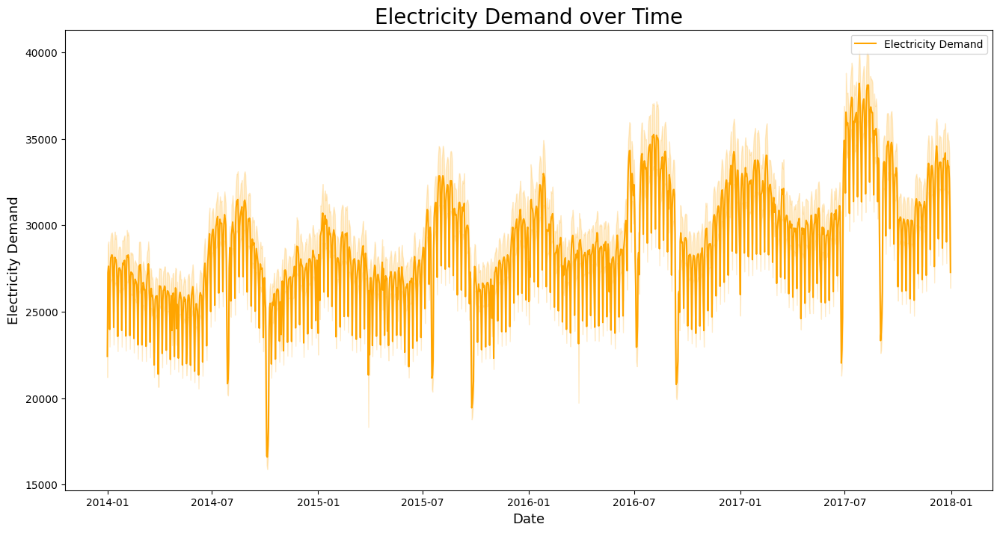

In [12]:
# Draw a basic plot of the data to get a sense of the data and its properties
f, ax = plt.subplots(figsize=(16,8))
sns.lineplot(data=train_df,x = pd.to_datetime(train_df['datetime']).dt.date,y = 'demand', color='orange',label='Electricity Demand')
ax.set_title('Electricity Demand over Time', fontsize=20)
ax.set_ylabel('Electricity Demand', fontsize=13)
ax.set_xlabel('Date', fontsize=13)
plt.legend(fontsize=10)
plt.show()



## Initial Observations on Electricity Demand

Upon initial examination of the data, several key characteristics are apparent:

1. **Seasonality**: The data exhibits clear seasonal patterns. This suggests that the time of year significantly influences electricity demand.

2. **Trend**: There is an evident upward trend in the data, indicating that electricity demand has been increasing over time.

3. **Spikes and Outliers**: The data contains noticeable spikes and outliers. These are consistent and may represent specific events or anomalies. These will be addressed and handled appropriately in later stages of the analysis. 


## Feature Engineering from DateTime Column

The function `datetime_feature_engineering(df)` is designed to extract and create new features from the 'datetime' column of the input DataFrame. These features are expected to provide additional insights that could be useful for our model and make data visualization easier.

The function performs the following operations:

1. **Convert 'datetime' column to datetime object**: This conversion is necessary to enable the extraction of specific components like hour, month, year, etc.

2. **Create 'hour' feature**: This feature represents the hour of the day and can help capture daily patterns in electricity demand.

3. **Create 'month' feature**: This feature represents the month of the year and can help capture monthly patterns in electricity demand.

4. **Create 'year' feature**: This feature represents the year and can help capture any long-term trends in electricity demand.

5. **Create 'season' feature**: This feature categorizes the months into four seasons: Winter, Spring, Summer, and Autumn. This can help capture seasonal patterns in electricity demand.

6. **Create 'day_of_week' feature**: This feature represents the day of the week and can help capture weekly patterns in electricity demand.

7. **Create 'is_weekday' feature**: This binary feature indicates whether a day is a weekday (Monday to Friday) or not. This can help capture patterns related to the difference in electricity demand between weekdays and weekends.

By creating these features, we can better understand the temporal patterns and trends in the electricity demand data.

In [13]:
train_df = datetime_feature_engineering(train_df)

/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_3391/2984946602.py:14: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  plot_intervals = [train_df['datetime'].dt.dayofyear, train_df['datetime'].dt.week, train_df['datetime'].dt.month, train_df['season']]


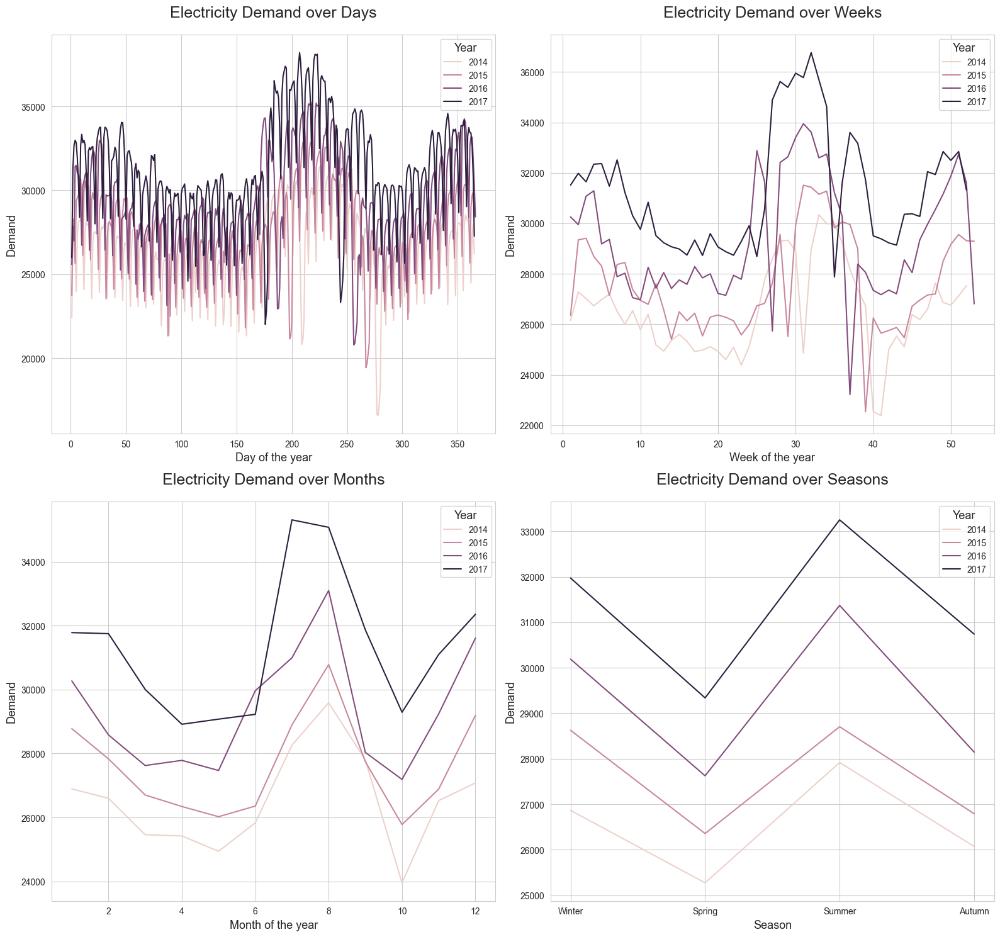

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style of the plot to be white background with grid
sns.set_style("whitegrid")

# Create a subplot with 2 rows and 2 columns
f, ax = plt.subplots(nrows=2, ncols=2, figsize=(16, 15))

# Flatten the axes array
ax = ax.flatten()

# Setting the plot intervals and necessary titles for the plot
plot_intervals = [train_df['datetime'].dt.dayofyear, train_df['datetime'].dt.week, train_df['datetime'].dt.month, train_df['season']]
titles = ['Electricity Demand over Days', 'Electricity Demand over Weeks', 'Electricity Demand over Months', 'Electricity Demand over Seasons']
xlabels = ['Day of the year', 'Week of the year', 'Month of the year', 'Season']

# Plotting the data
for i in range(len(plot_intervals)):
    sns.lineplot(data=train_df, x=plot_intervals[i], y='demand', hue='year', ax=ax[i],errorbar=None)
    ax[i].set_title(titles[i], fontsize=18, pad=20)
    ax[i].set_ylabel('Demand', fontsize=13)
    ax[i].set_xlabel(xlabels[i], fontsize=13)
    
    # Adjust legend
    ax[i].legend(title='Year', title_fontsize='13', loc='upper right')

plt.tight_layout()
plt.show()

## Analysis of Electricity Demand From Different Time Intervals

### Daily Interval
At the daily level, the data presents a complex pattern with noticeable spikes and seasonality. However, the high granularity makes it challenging to discern clear trends or patterns.

### Weekly Interval
The weekly data offers a clearer view of the underlying patterns. Notable fluctuations, which could serve as valuable indicators for our model, become more apparent at this level. Despite variations in the magnitude of differences between years, a consistent weekly seasonality is evident.

### Monthly Interval
The monthly interval further simplifies the data, making it easier to identify the recurring seasonal patterns. This level of data aggregation could provide robust indicators for our predictive model. The data also reveals distinct yearly patterns.

### Seasonal Interval
At the seasonal level, the distributions across different years become remarkably similar. As we increase the time frame, the seasonality becomes more pronounced, even across different time intervals. Interestingly, despite the significant gap in consumption due to the increasing trend, the degree of change remains relatively consistent when viewed at a seasonal interval. This consistency could be a valuable insight for our analysis.

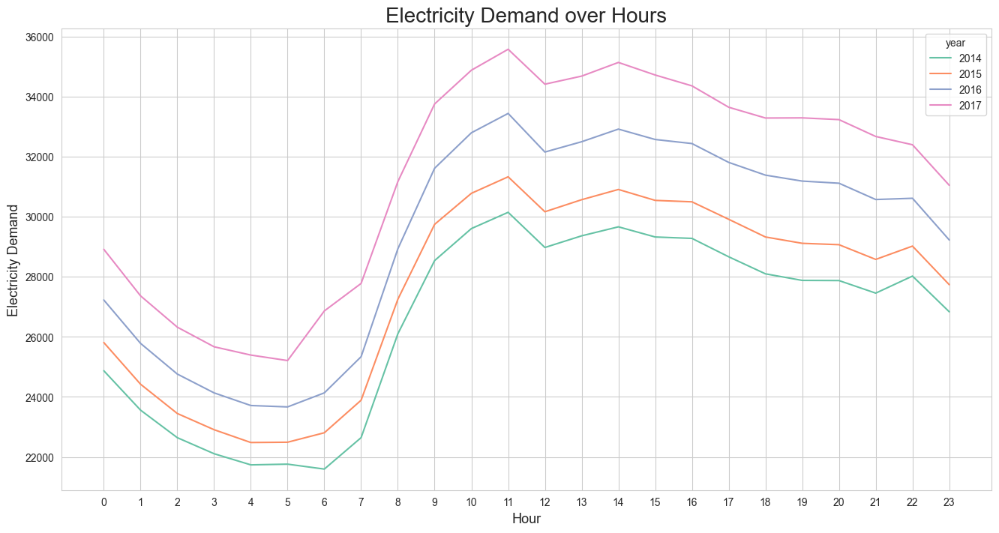

In [15]:
# Hourly Demand -  for years
f, ax = plt.subplots(figsize=(16,8))
sns.lineplot(data=train_df,x = 'hour',y = 'demand', hue='year', palette='Set2', errorbar=None)
ax.set_title('Electricity Demand over Hours', fontsize=20)
ax.set_ylabel('Electricity Demand', fontsize=13)
ax.set_xlabel('Hour', fontsize=13)
_ = ax.set_xticks(range(0,24))

## Analyzing Hourly Electricity Demand

We can gain valuable insights by examining the electricity demand across different hours of the day for each year. Specifically, this analysis can:

* Capture the daily routines of the city's inhabitants, reflecting lifestyle and consumption patterns.
* Indicate the operational hours of major industrial facilities, providing insights into industrial energy consumption.
* Help us understand patterns in electricity usage, potentially highlighting peak demand periods.
* Inform energy management strategies by identifying times of high and low demand.

This temporal analysis is a crucial step in our data exploration.

## Stability of Hourly Electricity Demand Over Years

From our analysis, it's evident that the hourly electricity demand has shown minimal variation over the years, indicating a stable pattern of energy consumption. This stability suggests that the lifestyle patterns and operational hours of facilities have remained consistent.

## Distinct Characteristics of Hourly Periods

Each hour period exhibits unique characteristics, which can be attributed to the daily routines of the city's inhabitants and the operational schedules of industrial facilities. 

## Visualizing Grouped Hour Periods

To further explore these patterns, we will create a visualization grouping together similar hour periods. This will help us better understand the underlying patterns in electricity demand.


In [16]:
train_df['hour_periods'] = train_df['hour'].apply(hour_periods)

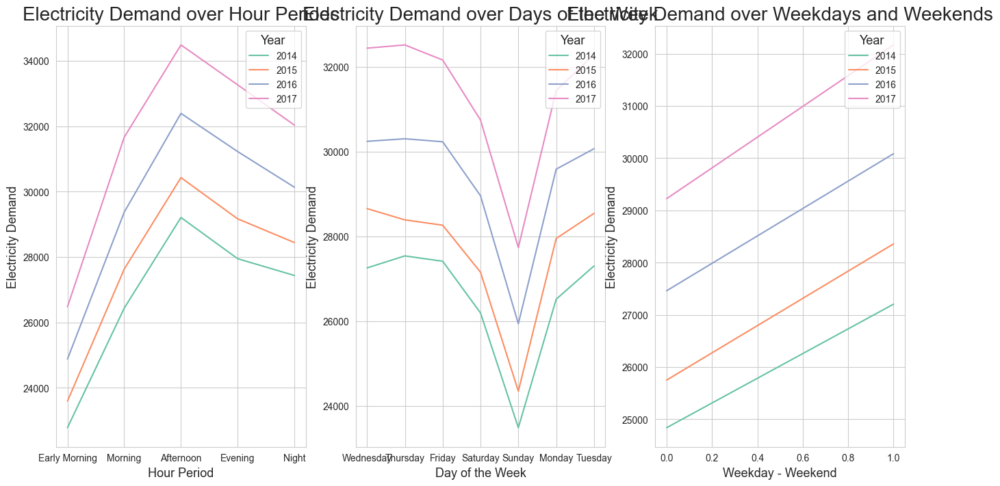

In [17]:
# Visualize the demand for each hour period, also visualizing day of the week for year
f, ax = plt.subplots(nrows=1,ncols=3,figsize=(16,8))
period = ['hour_periods','day_of_week','is_weekday']
titles = ['Electricity Demand over Hour Periods', 'Electricity Demand over Days of the Week','Electricity Demand over Weekdays and Weekends']
xlabels = ['Hour Period', 'Day of the Week','Weekday - Weekend']
for i in range(len(period)):
    sns.lineplot(data=train_df,x = period[i],y = 'demand', hue='year', palette='Set2', errorbar=None, ax=ax[i])
    ax[i].set_title(titles[i], fontsize=20)
    ax[i].set_ylabel('Electricity Demand', fontsize=13)
    ax[i].set_xlabel(xlabels[i], fontsize=13)
    ax[i].legend(title='Year', title_fontsize='13', loc='upper right')


## Analysis of Day-of-the-Week Feature

The 'day_of_the_week' feature reveals distinct patterns in electricity demand for each day of the week. Particularly, Saturdays and Sundays consistently show the lowest demand overall.

Moreover, the introduction of the 'is_weekday' feature provides further insights. The difference in electricity demand between weekdays and weekends is substantial, indicating a significant shift in usage patterns. This distinction could be instrumental in enhancing the predictive accuracy of our model.

In summary, these features allow us to better understand and capture the variations in electricity demand throughout the week, thereby improving our model's ability to make accurate predictions.

## Hour-period Demand Analysis

From the above analysis, it is evident that the electricity demand for each hour_period is remarkably consistent across different years, with only minimal variations. This consistency can be leveraged in several ways to enhance our predictive model:

1. **Feature for Model**: The hour-period demand can be used as a feature in our model. By capturing the demand pattern for each hour period, the model can better predict the demand for the upcoming hour period.

2. **Segmented Training**: Alternatively, we could use this feature to train separate models for each hour period. These individual models could then be combined to create a comprehensive model that predicts the overall demand.

These strategies will be further explored and implemented in the subsequent modeling section of this analysis.

## Creation of Lagged Features

Given the strong correlation between the hour and demand, we will enhance our model by creating lagged features. These features will be based on the demand from the same hour for the last three days and the last two weeks. 

This approach serves two purposes:

* It helps prevent overfitting by introducing more variability into the model.
* It provides the model with additional information, potentially improving its predictive performance.

The lagged features will represent the demand from 24, 48, 72 hours, and 1 and 2 weeks prior.

In [18]:
train_df = create_lagged_features(train_df, 'demand')

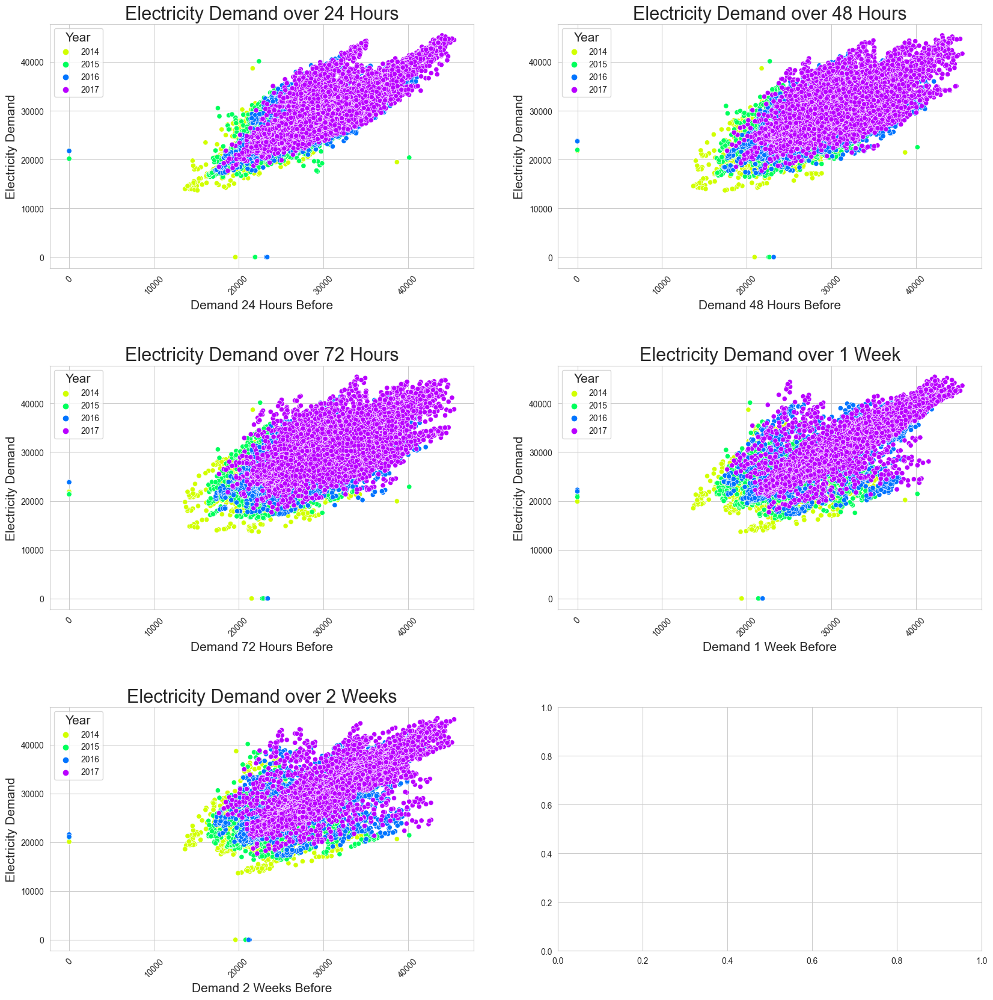

In [19]:
# Visualize the relationship between the demand and the lagged features
f, ax = plt.subplots(nrows=3, ncols=2, figsize=(20, 20))  # Increase figure size
ax = ax.ravel()  # Flatten the ax array
lagged_features = ['demand_lag_24', 'demand_lag_48', 'demand_lag_72', 'demand_lag_168', 'demand_lag_336']
titles = ['Electricity Demand over 24 Hours', 'Electricity Demand over 48 Hours', 'Electricity Demand over 72 Hours', 'Electricity Demand over 1 Week', 'Electricity Demand over 2 Weeks']
xlabels = ['Demand 24 Hours Before', 'Demand 48 Hours Before', 'Demand 72 Hours Before', 'Demand 1 Week Before', 'Demand 2 Weeks Before']

# Define a color palette
palette = sns.color_palette("hsv", len(train_df['year'].unique()))

for i in range(len(lagged_features)):
    sns.scatterplot(data=train_df, x=lagged_features[i], y='demand', hue='year', ax=ax[i], palette=palette)
    ax[i].set_title(titles[i], fontsize=22)  # Increase font size
    ax[i].set_ylabel('Electricity Demand', fontsize=15)  # Increase font size
    ax[i].set_xlabel(xlabels[i], fontsize=15)  # Increase font size
    ax[i].legend(title='Year', title_fontsize='15', loc='best')
    plt.setp(ax[i].xaxis.get_majorticklabels(), rotation=45)  # Rotate x-axis labels

plt.subplots_adjust(hspace=0.4)  # Adjust the space between subplots

## Lagged Features  Analysis

The distrubition analysis reveals a strong alignment between the hour of demand and the lagged features, indicating that these lagged features are valuable predictors. Furthermore, the variance of the demand appears to be increasing over time. 

To create a more robust model and mitigate overfitting, we can incorporate lagged features from 1 and 2 weeks prior. These features can capture longer-term patterns in the data, thereby enhancing the model's predictive performance and avoid overfitting 

# Handling Lagged Features in Time Series Forecasting

When forecasting time series data over a significant time frame (e.g., a 3-month period as we have given in test set) compare to day-ahead market, we encounter a challenge with lagged features. If we want to use these lagged features, we need to fill them with predicted values. However, this approach can lead to an increase in the error rate. With each lagged feature, we compound the prediction error rate, potentially leading to a substantial cumulative error at the end of the forecasted period.

## Proposed Strategies

To address this issue, we propose two primary strategies:

### Strategy 1: Model without Lagged Features

The first strategy involves training a model *without using lagged features*. By excluding lagged features, we eliminate the risk of compounding prediction errors. The performance of this model will provide a baseline against which we can compare other approaches.

### Strategy 2: Model with Rolling Forecast Origin

The second strategy involves training a model that *incorporates lagged values at each iteration*, using the predicted value from the previous step. This approach, known as a "*rolling forecast origin*", can potentially provide more accurate forecasts by leveraging the temporal dependencies in the data but because the forecast time window in test set is as large as 3 months it can also introduce more error with each prediction. 

However, it's important to note that this approach will be *computationally expensive*. Since we fit the model at each iteration, the computational cost increases with the size of the forecasted period. And Because we have to forecast 3 months period of time in the test set provided, this will take a lot of time and might not yield any significant positive effect because of the 3 months duration time, so even though its a good strategy for day-ahead markets we wont be using in this spesific challenge 




In [20]:
# we will be dropping the lagged features for 24, 48, 72 hours and 1, 2 weeks for now until the training phase 
train_df = remove_lagged_features(train_df, 'demand', [24, 48, 72, 24*7, 2*24*7])

## Addressing Zero Demand Values

In the demand graph, we observe instances of zero demand on the train set. These zero values could potentially distort our analysis and model performance. To address this, we'll implement a strategy to replace these zero values.

Our chosen method is a forward fill operation, specifically based on the same hour of subsequent days. This approach is chosen due to the cyclical nature of electricity demand within a 24-hour period. Consequently, the demand value at the same hour of the following days becomes the most suitable replacement for these zero values.

In [21]:
train_df = replace_zero_with_forward_fill(train_df, 'demand')

In [22]:
train_df

,datetime,precipitation,temperature,irradiance_surface,irradiance_toa,snowfall,snow_mass,cloud_cover,air_density,demand,hour,month,year,season,day_of_week,is_weekend,is_weekday,hour_periods
0,2014-01-01 00:00:00,0.0024,-1.693,0.0000,0.0000,0.0013,5.0829,0.5736,1.1372,21809.63,0,January,2014,Winter,Wednesday,False,True,Early Morning
1,2014-01-01 01:00:00,0.0011,-1.912,0.0000,0.0000,0.0003,5.0840,0.5857,1.1381,20711.50,1,January,2014,Winter,Wednesday,False,True,Early Morning
2,2014-01-01 02:00:00,0.0014,-2.088,0.0000,0.0000,0.0002,5.0846,0.5982,1.1390,19460.02,2,January,2014,Winter,Wednesday,False,True,Early Morning
3,2014-01-01 03:00:00,0.0016,-2.245,0.0000,0.0000,0.0003,5.0854,0.5891,1.1400,18654.16,3,January,2014,Winter,Wednesday,False,True,Early Morning
4,2014-01-01 04:00:00,0.0016,-2.393,2.2857,6.9264,0.0005,5.0862,0.5619,1.1410,18090.40,4,January,2014,Winter,Wednesday,False,True,Early Morning
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35059,2017-12-31 19:00:00,0.1381,1.333,0.0000,0.0000,0.0564,2.2242,0.5876,1.1216,29948.34,19,December,2017,Winter,Sunday,True,False,Evening
35060,2017-12-31 20:00:00,0.1319,1.074,0.0000,0.0000,0.0571,2.2812,0.5674,1.1228,28473.65,20,December,2017,Winter,Sunday,True,False,Evening
35061,2017-12-31 21:00:00,0.1326,0.910,0.0000,0.0000,0.0694,2.3461,0.5475,1.1234,27349.36,21,December,2017,Winter,Sunday,True,False,Night
35062,2017-12-31 22:00:00,0.1299,0.784,0.0000,0.0000,0.0757,2.4209,0.5312,1.1235,27035.33,22,December,2017,Winter,Sunday,True,False,Night


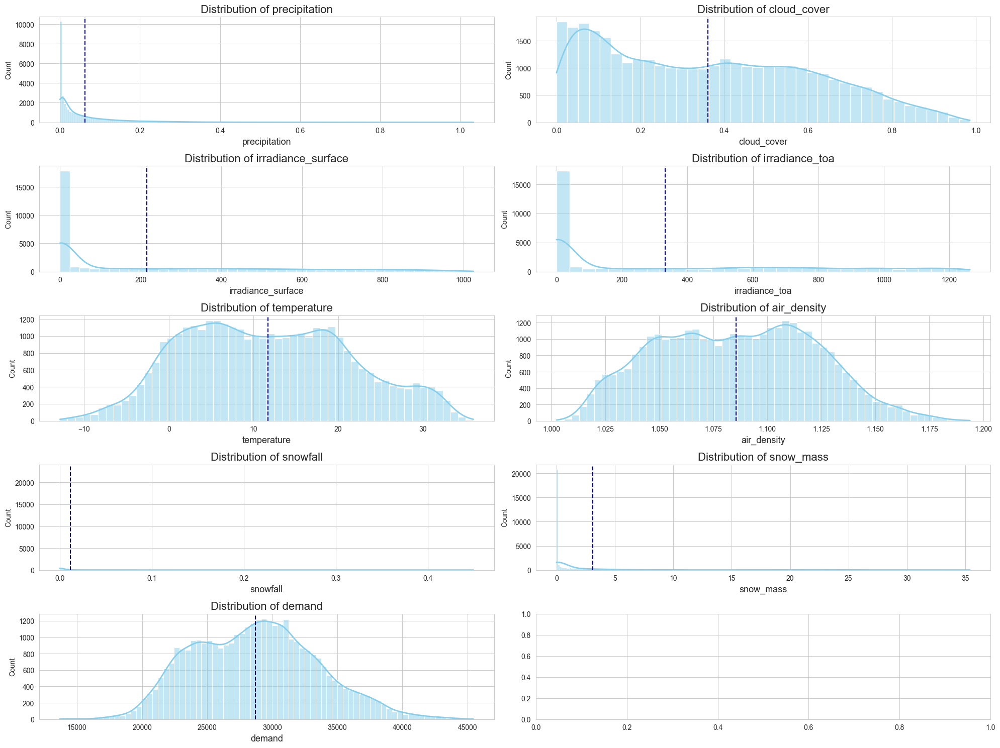

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt

continuous_variables = ['precipitation','cloud_cover','irradiance_surface','irradiance_toa','temperature','air_density','snowfall','snow_mass','demand']

f, ax = plt.subplots(nrows=5, ncols=2, figsize=(20, 15))
ax = ax.ravel()  # Flatten the ax array

for i in range(len(continuous_variables)):
    sns.histplot(train_df[continuous_variables[i]], ax=ax[i], kde=True, color='skyblue', 
                 line_kws={'linewidth':2, 'color':'red'})
    ax[i].axvline(train_df[continuous_variables[i]].mean(), color='darkblue', linestyle='--')
    ax[i].set_title(f'Distribution of {continuous_variables[i]}', fontsize=16)
    ax[i].set_xlabel(continuous_variables[i], fontsize=13)

plt.tight_layout()

## Data Distribution Analysis

From the distribution plots, we observe that the variables `precipitation`, `irradiance_surface`, `irradiance_toa`, `snowfall`, `snow_mass`, and `cloud_cover` exhibit a left skew. In the event of missing values, it would be more appropriate to use the median, rather than the mean, to fill these in due to the skewness of their distributions.

On the other hand, the variables `temperature` and `air_density` display distributions that are more normally distributed. This implies that the mean could be a suitable choice for filling in any missing values for these variables.

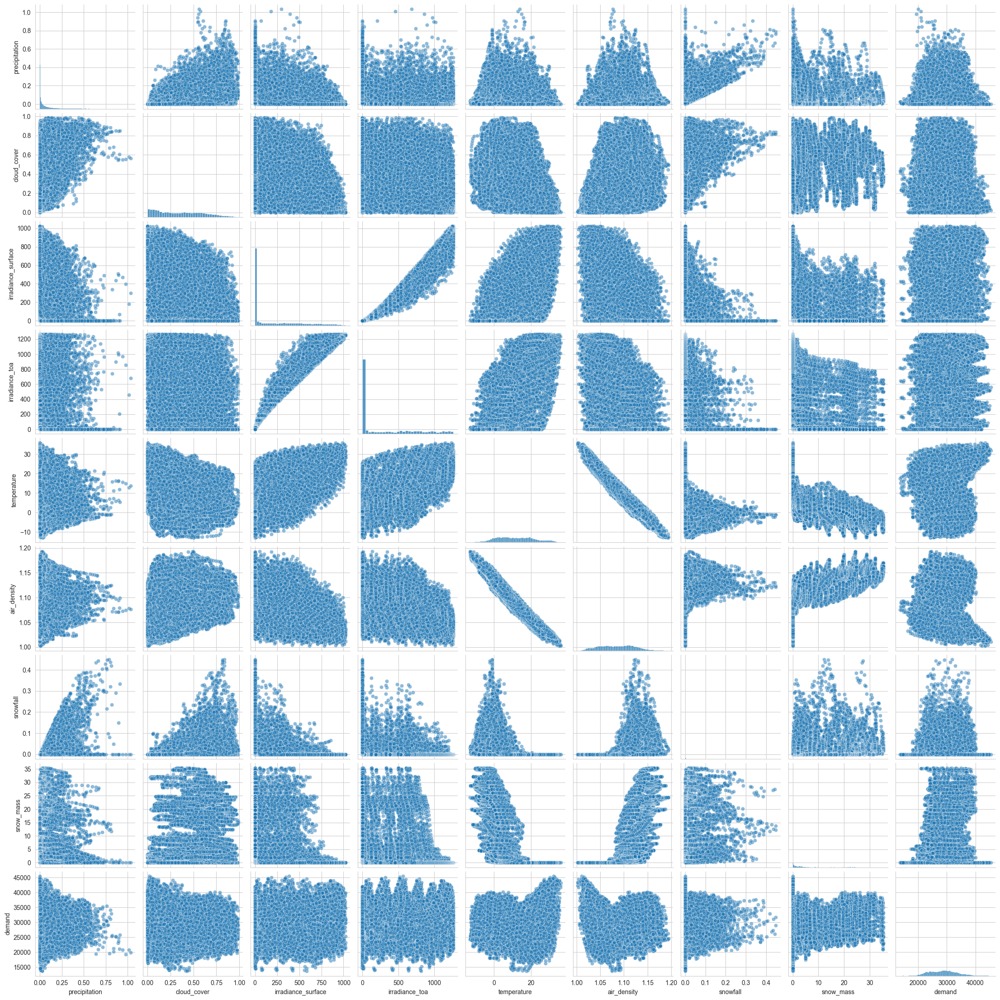

In [24]:
import seaborn as sns

# Select only the continuous variables
continues_variables = ['precipitation','cloud_cover','irradiance_surface','irradiance_toa','temperature','air_density','snowfall','snow_mass','demand']

df_continuous = train_df[continuous_variables]

# Create pair plots
sns.pairplot(df_continuous, plot_kws={'alpha': 0.5})

Our analysis reveals significant positive and negative correlations among various variables. These relationships are effectively visualized using a heatmap.

By leveraging a heatmap, we can quickly identify and comprehend the relationships between different variables. This insight is crucial for subsequent data analysis and predictive modeling.

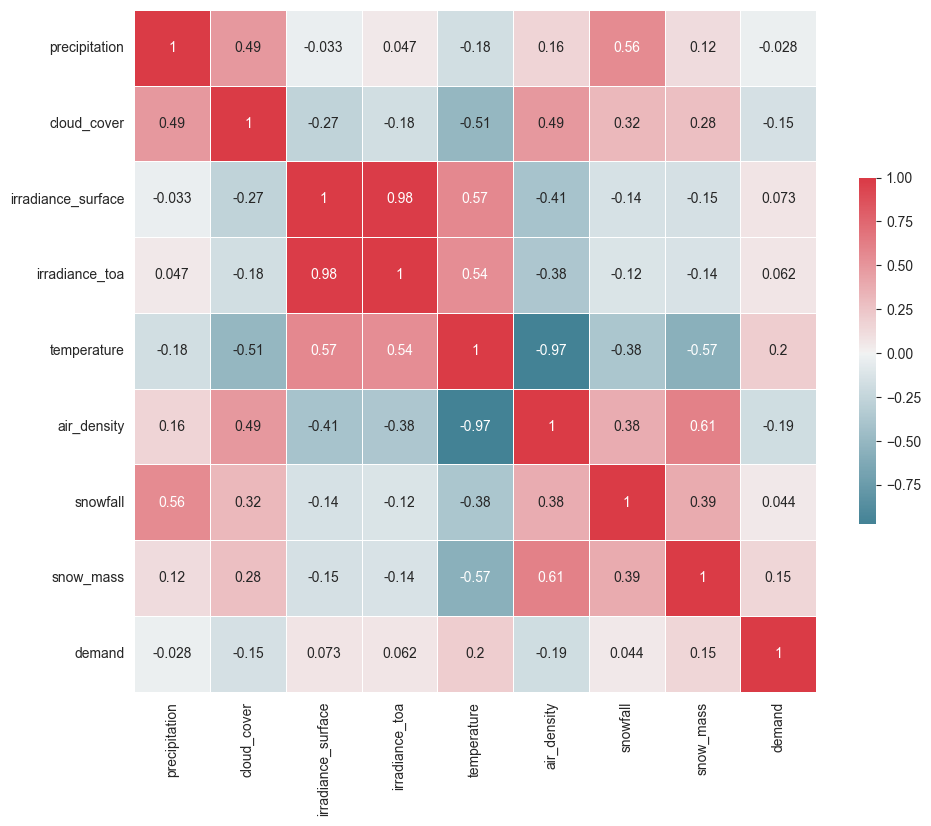

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt

# Compute the correlation matrix
corr = df_continuous.corr()

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the correct aspect ratio
sns.heatmap(corr, cmap=cmap, center=0, annot=True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.show()

## Key Observations from Correlation Analysis

Our correlation analysis has yielded several noteworthy findings:

- **Surface Irradiance and Top of Atmosphere Irradiance**: These two variables exhibit a high positive correlation of 0.98. This suggests that they typically increase or decrease in tandem.

- **Temperature and Air Density**: There is a strong negative correlation (-0.97) between these variables, indicating that as temperature rises, air density tends to fall.

- **Precipitation and Snowfall**: A moderate positive correlation of 0.56 is observed between these weather-related variables, suggesting that they often occur together.

- **Cloud Cover and Temperature**: These variables show a moderate negative correlation (-0.51). This implies that higher levels of cloud cover are generally associated with lower temperatures.

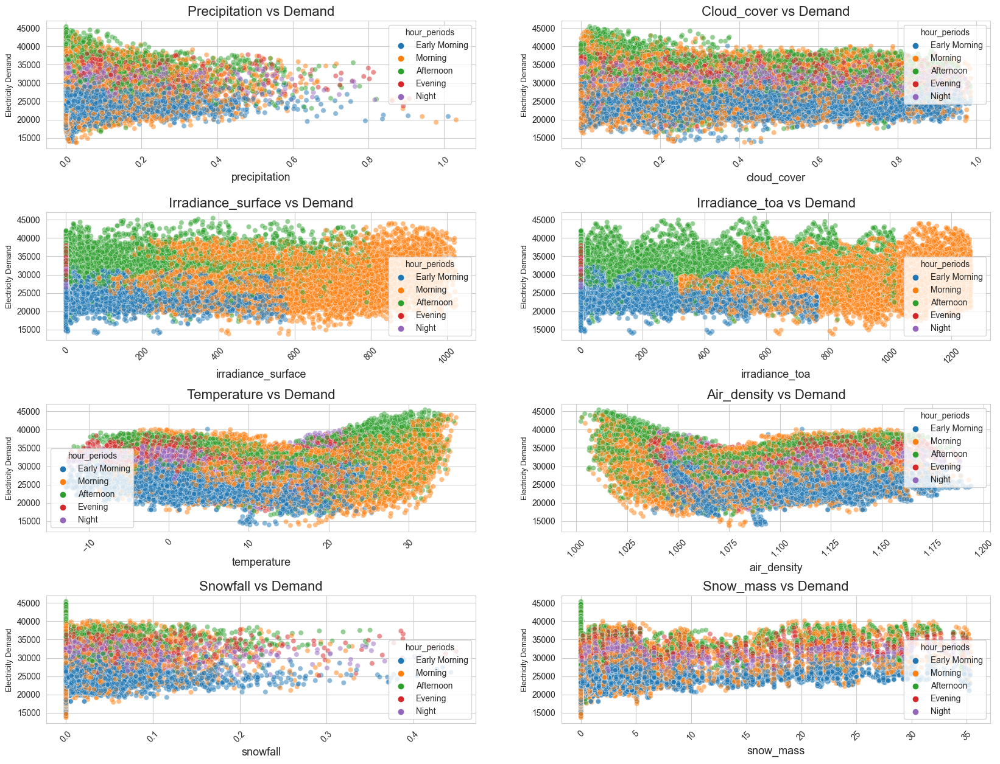

In [26]:
import pandas as pd

# Assuming 'hour_period' is a column in your DataFrame
continuous_variables = ['precipitation','cloud_cover','irradiance_surface','irradiance_toa','temperature','air_density','snowfall','snow_mass']

f, ax = plt.subplots(nrows=4, ncols=2, figsize=(20, 15))  # Increase figure size
ax = ax.ravel()  # Flatten the ax array
titles = [f'{var.capitalize()} vs Demand' for var in continuous_variables]
xlabels = continuous_variables
for i in range(len(continuous_variables)):
    sns.scatterplot(data=train_df, x=continuous_variables[i], y='demand', hue='hour_periods', alpha=0.5, ax=ax[i])
    ax[i].set_title(titles[i], fontsize=16)  # Increase font size
    ax[i].set_ylabel('Electricity Demand', fontsize=9)  # Increase font size
    ax[i].set_xlabel(xlabels[i], fontsize=13)  # Increase font size
    plt.setp(ax[i].xaxis.get_majorticklabels(), rotation=45)  # Rotate x-axis labels

plt.subplots_adjust(hspace=0.5)  # Adjust the space between subplots

/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_3391/1122640196.py:43: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  daily_train_df = train_df.resample('D', on='datetime').mean()


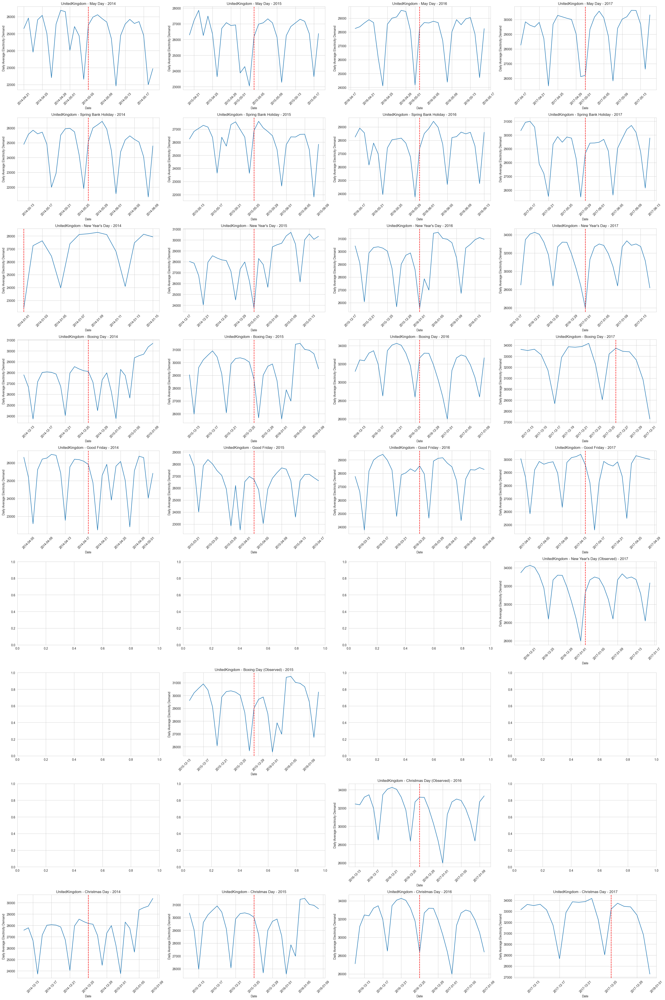

In [27]:
# Plot UK Holidays
plot_holidays('UnitedKingdom')


/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_3391/1122640196.py:43: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  daily_train_df = train_df.resample('D', on='datetime').mean()


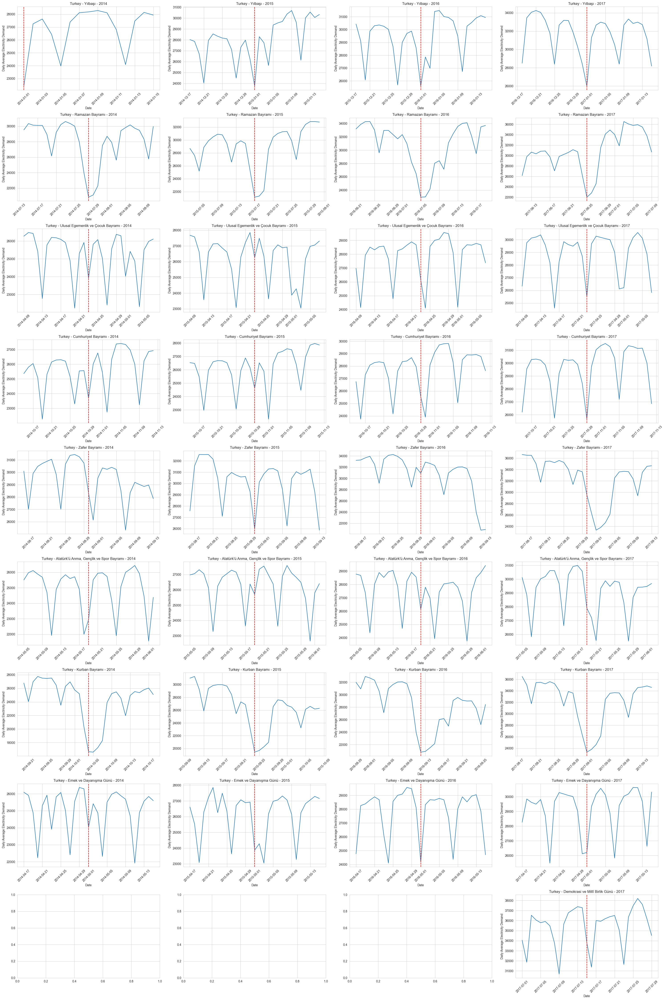

In [28]:
# Plot Turkey Holidays 
plot_holidays('Turkey')

# Analysis Summary

- The visualizations suggest that the country under study is **Turkey** compare to **England** (well we used a little bit of domain knowledge to  narrow down the list of potential countries list :) ), based on the alignment of electricity demand patterns with Turkish holidays.
- Many holidays are global and exhibit similar demand patterns, providing a level of predictability.
- The consistency of demand patterns over the years indicates that fluctuations are manageable and unlikely to cause significant issues for electricity supply planning.
- This analysis highlights the importance of data visualization and domain knowledge in interpreting data and making informed predictions.
- Also even if the data is not from turkey it exibits a certain pattern between most dates so it wont be effecting data in a major way 

In [29]:
# Use the function to add a holiday column to the DataFrame
train_df = add_holiday_column(train_df, 'Turkey')

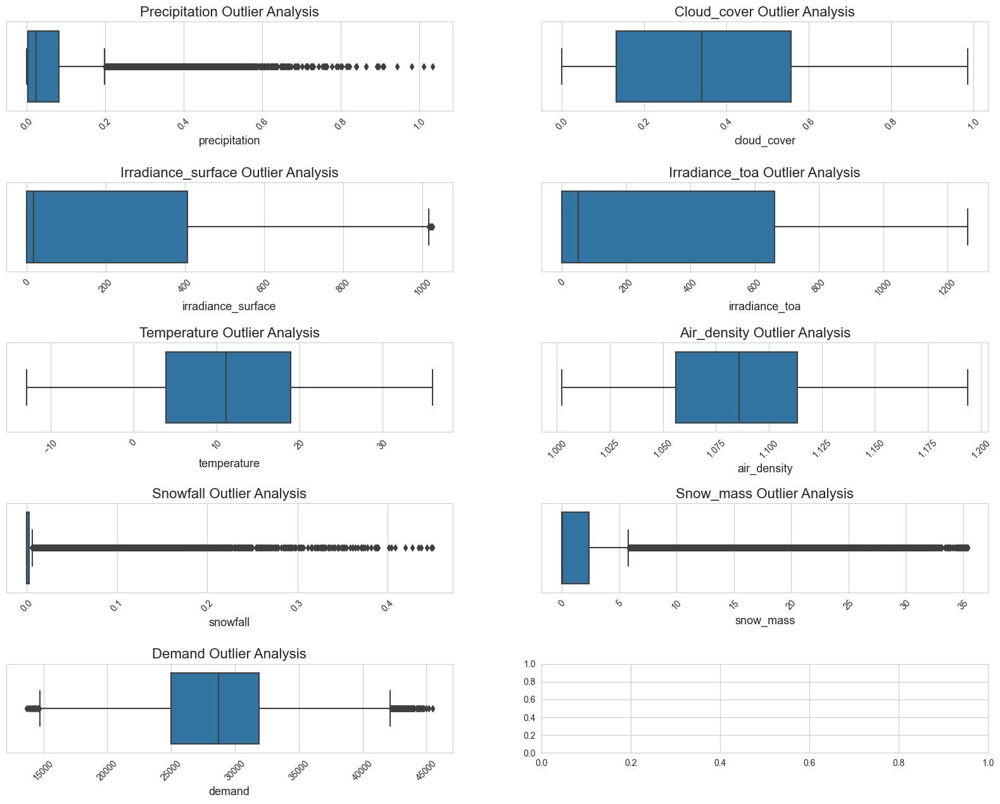

In [30]:
# Outlier Analysis 
# Boxplot
continuous_variables = ['precipitation','cloud_cover','irradiance_surface','irradiance_toa','temperature','air_density','snowfall','snow_mass','demand']
titles = [f'{var.capitalize()} Outlier Analysis' for var in continuous_variables]
xlabels = continuous_variables
f, ax = plt.subplots(nrows=5, ncols=2, figsize=(20, 15))  # Increase figure size
ax = ax.ravel()  # Flatten the ax array
for i in range(len(continuous_variables)):
    sns.boxplot(x=train_df[continuous_variables[i]], ax=ax[i])
    ax[i].set_title(titles[i], fontsize=16)  # Increase font size
    ax[i].set_xlabel(xlabels[i], fontsize=13)  # Increase font size
    plt.setp(ax[i].xaxis.get_majorticklabels(), rotation=45)  # Rotate x-axis labels
    
plt.subplots_adjust(hspace=0.8)  # Adjust the space between subplots

/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_3391/1122640196.py:86: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  daily_df = df_copy.resample('D').mean()


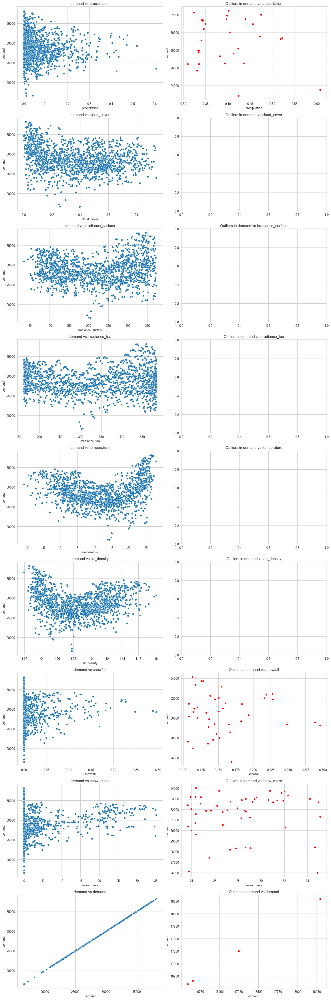

In [31]:
continues_variables = ['precipitation','cloud_cover','irradiance_surface','irradiance_toa','temperature','air_density','snowfall','snow_mass']
# Use the function to plot the continuous variables on outliers
plot_continuous_outlier_variables(train_df, continuous_variables,'demand')

# Outlier Analysis

Upon examining the data, it's evident that the outliers do not represent errors or noise. Their presence is minimal, and they seem to be legitimate data points. Therefore, we have decided not to exclude these outliers or perform any specific computations on them.

In [32]:
# Dropping the year column as we will have year 2018 as our test set and we have not any data for 2018 so it will be a useless column for our model
train_df.drop(columns=['year'],inplace=True)


## Cyclic Encoding of 'Hour' Variable

The 'hour' variable is a cyclical feature as it follows a cycle of 24 hours. After the 23rd hour, the cycle doesn't progress to the 24th hour, but instead resets back to 0. 

Traditional numerical encoding could lead the model to learn incorrect associations, such as hour '0' being very different from hour '23', while in reality they are very close to each other (only 1 hour apart).

Cyclic encoding helps to preserve this cyclical nature by mapping each hour to a point on a circle. This way, the distance between each hour is proportional to the time difference between them, preserving the cyclical nature of the feature.

We use sine and cosine transformations to achieve this. The 'hour' variable is transformed into two new variables, often called 'sin_hour' and 'cos_hour'. This allows the model to understand the cyclical nature of hours in a day.

In [33]:
train_df = encode_cyclic_feature(train_df, col='hour', max_val=23,drop=True)

## Encoding The Categoical Features

In [34]:
train_df = categorical_encoding(train_df, ['month','hour_periods','day_of_week', 'season'])

## Baseline Model Creation

We will start our modeling process by creating two simple baseline models. These models serve as a reference point to compare the performance of our future, more complex models against. 

The first baseline model we will use is Simple Linear Regression. This model assumes a linear relationship between the input variables (the independent variables) and the single output variable (the dependent variable). 

Once we have established the baseline, we can proceed to train more complex models and aim to achieve better performance than these baselines.

In [35]:
train_x,train_y,test_x,test_y= train_test_split(train_df, 'demand', test_size=0.1,drop_datetime=False,set_index=True)

train_size:  31558
test_size:  3506


In [36]:
train_x

,precipitation,temperature,irradiance_surface,irradiance_toa,snowfall,snow_mass,cloud_cover,air_density,is_weekend,is_weekday,is_holiday,hour_sin,hour_cos,month_April,month_August,month_December,month_February,month_January,month_July,month_June,month_March,month_May,month_November,month_October,month_September,hour_periods_Afternoon,hour_periods_Early Morning,hour_periods_Evening,hour_periods_Morning,hour_periods_Night,day_of_week_Friday,day_of_week_Monday,day_of_week_Saturday,day_of_week_Sunday,day_of_week_Thursday,day_of_week_Tuesday,day_of_week_Wednesday,season_Autumn,season_Spring,season_Summer,season_Winter
datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-01-01 00:00:00,0.0024,-1.693,0.0000,0.0000,0.0013,5.0829,0.5736,1.1372,False,True,True,0.000000,1.000000,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1
2014-01-01 01:00:00,0.0011,-1.912,0.0000,0.0000,0.0003,5.0840,0.5857,1.1381,False,True,True,0.269797,0.962917,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1
2014-01-01 02:00:00,0.0014,-2.088,0.0000,0.0000,0.0002,5.0846,0.5982,1.1390,False,True,True,0.519584,0.854419,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1
2014-01-01 03:00:00,0.0016,-2.245,0.0000,0.0000,0.0003,5.0854,0.5891,1.1400,False,True,True,0.730836,0.682553,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1
2014-01-01 04:00:00,0.0016,-2.393,2.2857,6.9264,0.0005,5.0862,0.5619,1.1410,False,True,True,0.887885,0.460065,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-07 17:00:00,0.0047,24.732,0.0476,0.2179,0.0000,0.0000,0.0825,1.0283,False,True,False,-0.997669,-0.068242,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
2017-08-07 18:00:00,0.0016,23.709,0.0000,0.0000,0.0000,0.0000,0.0630,1.0322,False,True,False,-0.979084,0.203456,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0
2017-08-07 19:00:00,0.0012,22.813,0.0000,0.0000,0.0000,0.0000,0.0477,1.0354,False,True,False,-0.887885,0.460065,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0


In [37]:
from sklearn.linear_model import LinearRegression,PoissonRegressor
model = LinearRegression()
model.fit(train_x,train_y)
pred_y  = model.predict(test_x)

# Calculate MAPE
mape = calculate_mape(test_y,pred_y)
print(f'MAPE: {mape.mean()}%')

# Calculate RMSE
rmse = calculate_RMSE(test_y,pred_y)
print(f'RMSE: {rmse}')

# Calculate MAE
mae = calculate_MAE(test_y,pred_y)
print(f'MAE: {mae}')

MAPE: 11.839452367370223%
RMSE: 4209.74
MAE: 3811.34


# Hyperparameter Tuning with Optuna and TimeSeriesSplit

In this notebook, we will be using Optuna for hyperparameter tuning of our XGBoost model. Optuna is a powerful library for hyperparameter tuning that provides an efficient way to optimize hyperparameters based on a specified objective function. Optuna offers robust visualization capabilities, making it easy to monitor and study all aspects of the training process. These visualizations provide an accessible way to track the progress and performance of our model over time.

We will be using TimeSeriesSplit for cross-validation. This is a suitable choice for our dataset due to the high correlation between days. Traditional cross-validation techniques like KFold may not be appropriate in this context as they could disrupt the temporal order of the data.

The hyperparameters we will be tuning include:

- `learning_rate`: This determines the step size at each iteration while moving toward a minimum of a loss function. A smaller learning rate requires more iterations.
- `colsample_bytree`: This is the subsample ratio of columns when constructing each tree.
- `max_depth`: This determines how deeply each tree is allowed to grow during any boosting round.
- `min_child_weight`: This provides control over under-fitting. Higher values prevent a model from learning relations which might be highly specific to the particular sample selected for a tree.
- `interaction_constraints`: Means that the model can only use the grouped features for interactions.


Lastly, we will set the seed to 42 to ensure reproducible results.

After each round of training, we will plot the feature importance by gain and a graph of actual vs predicted values for the last turn of the TimeSeriesSplit.

In [38]:
# SKLEARN API 
def objective(trial):
    params = {
        "objective": "reg:squarederror",
        "n_estimators": 1000,
        "verbosity": 0,
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.15),
        "max_depth": trial.suggest_int("max_depth", 2,8),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.7, 1.0),
        "min_child_weight": trial.suggest_int("min_child_weight", 3,8),
        'interaction_constraints': [["hour_sin","hour_cos"]]
    }

    model = xgb.XGBRegressor(**params)
    tscv = TimeSeriesSplit(n_splits=5)
    rmses = []
    
            
    for train_index,val_index in tscv.split(train_x):
        
        X_train, X_val = train_x.iloc[train_index], train_x.iloc[val_index]
        y_train, y_val = train_y[train_index], train_y[val_index]
        

        
        model.fit(X_train, y_train, 
                    eval_set=[(X_val, y_val)], 
                    verbose=False)
                
        predictions = model.predict(X_val)
        rmse = calculate_RMSE(y_val, predictions)

        rmses.append(rmse)
        
    # Plot actual vs predicted values
    if trial.number % 5 == 0:
        plt.figure(figsize=(12, 5))
        plt.plot(y_val.values, label='Actual')
        plt.plot(predictions, label='Predicted')
        plt.legend()
        plt.show()

        # Plot feature importance
        xgb.plot_importance(model, importance_type='gain', title='Feature importance by gain')
        plt.show()
    return np.mean(rmses)

[I 2023-11-27 22:38:53,240] A new study created in memory with name: no-name-ee9c5013-4d90-4016-bc00-41f4f68484be


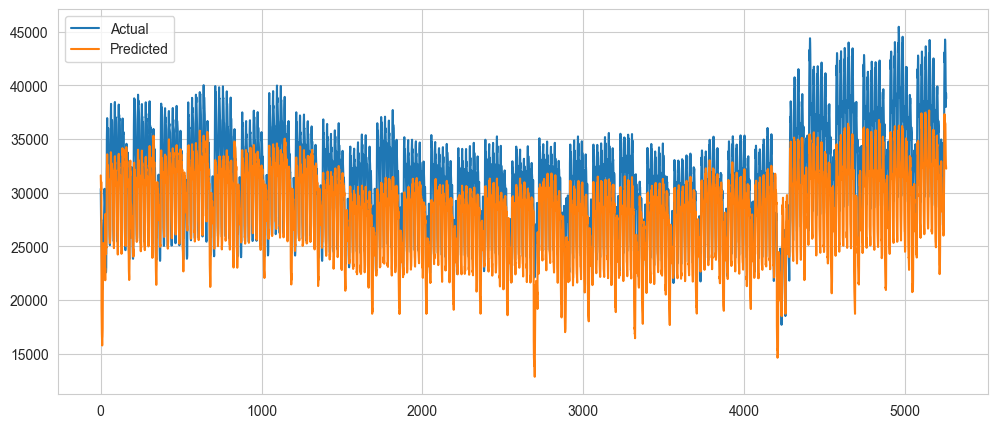

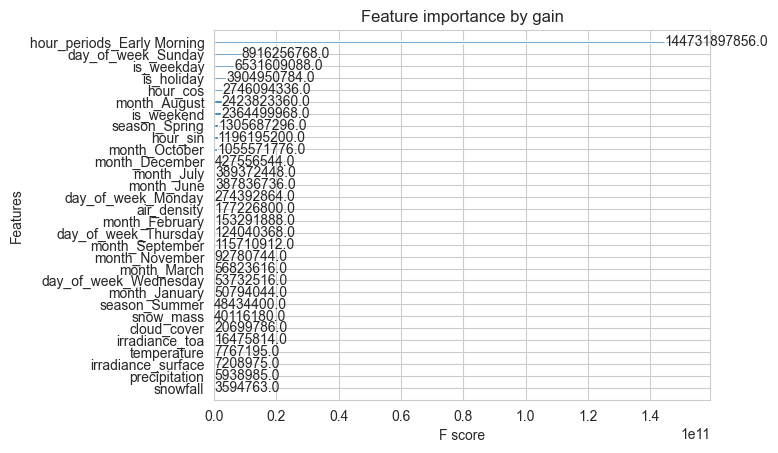

[I 2023-11-27 22:39:26,169] Trial 0 finished with value: 2608.0499999999997 and parameters: {'learning_rate': 0.040371568583314796, 'max_depth': 8, 'colsample_bytree': 0.9069449652702305, 'min_child_weight': 6}. Best is trial 0 with value: 2608.0499999999997.
[I 2023-11-27 22:39:58,847] Trial 1 finished with value: 2607.8100000000004 and parameters: {'learning_rate': 0.07196133948657558, 'max_depth': 7, 'colsample_bytree': 0.7048533599310874, 'min_child_weight': 5}. Best is trial 1 with value: 2607.8100000000004.
[I 2023-11-27 22:40:35,199] Trial 2 finished with value: 2624.616 and parameters: {'learning_rate': 0.12088246014064079, 'max_depth': 8, 'colsample_bytree': 0.853938565878193, 'min_child_weight': 4}. Best is trial 1 with value: 2607.8100000000004.
[I 2023-11-27 22:41:04,865] Trial 3 finished with value: 2606.722 and parameters: {'learning_rate': 0.12584097291412547, 'max_depth': 6, 'colsample_bytree': 0.7491059139673908, 'min_child_weight': 5}. Best is trial 3 with value: 2606

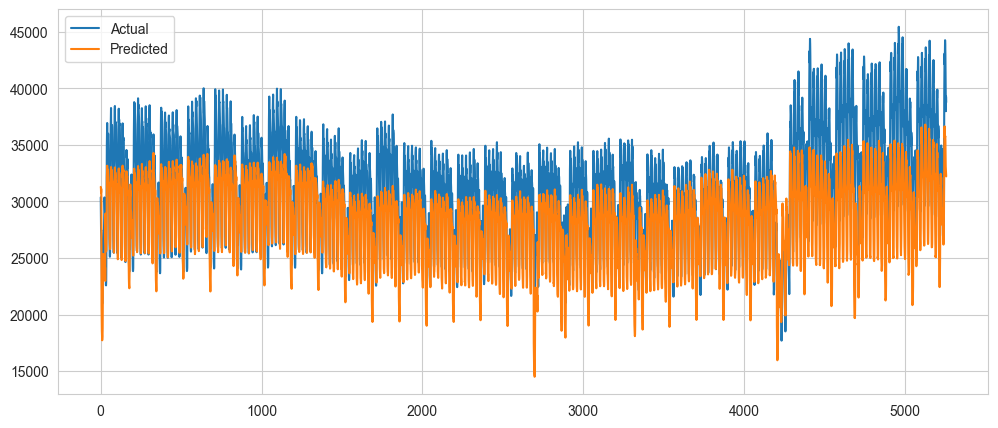

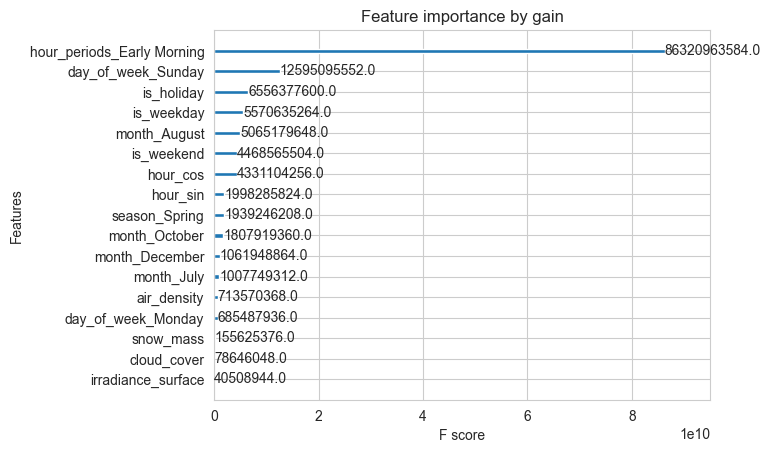

[I 2023-11-27 22:41:59,108] Trial 5 finished with value: 2680.5780000000004 and parameters: {'learning_rate': 0.013867319508255076, 'max_depth': 6, 'colsample_bytree': 0.7547106579546573, 'min_child_weight': 5}. Best is trial 3 with value: 2606.722.
[I 2023-11-27 22:42:18,398] Trial 6 finished with value: 2569.3239999999996 and parameters: {'learning_rate': 0.09233585615751332, 'max_depth': 2, 'colsample_bytree': 0.8219565571888161, 'min_child_weight': 5}. Best is trial 6 with value: 2569.3239999999996.
[I 2023-11-27 22:42:50,346] Trial 7 finished with value: 2610.152 and parameters: {'learning_rate': 0.09149994640072419, 'max_depth': 7, 'colsample_bytree': 0.8291741207714076, 'min_child_weight': 7}. Best is trial 6 with value: 2569.3239999999996.
[I 2023-11-27 22:43:21,268] Trial 8 finished with value: 2618.928 and parameters: {'learning_rate': 0.08524483735428473, 'max_depth': 8, 'colsample_bytree': 0.9235310894154578, 'min_child_weight': 8}. Best is trial 6 with value: 2569.32399999

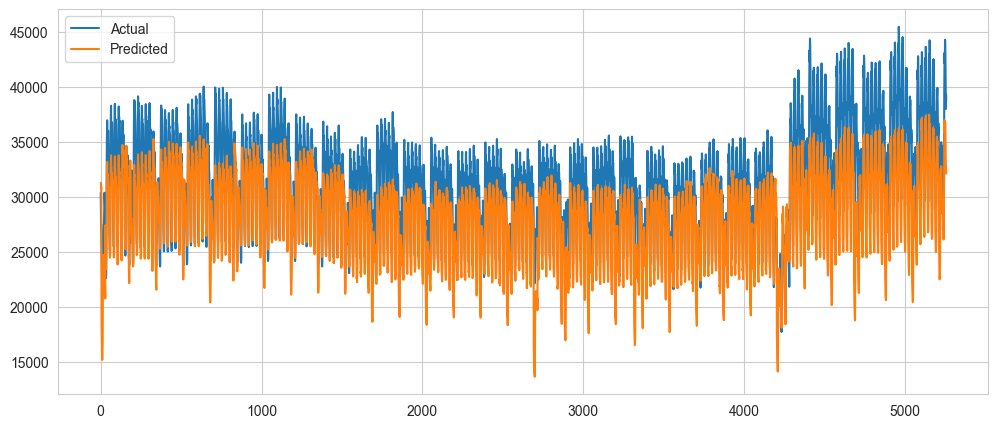

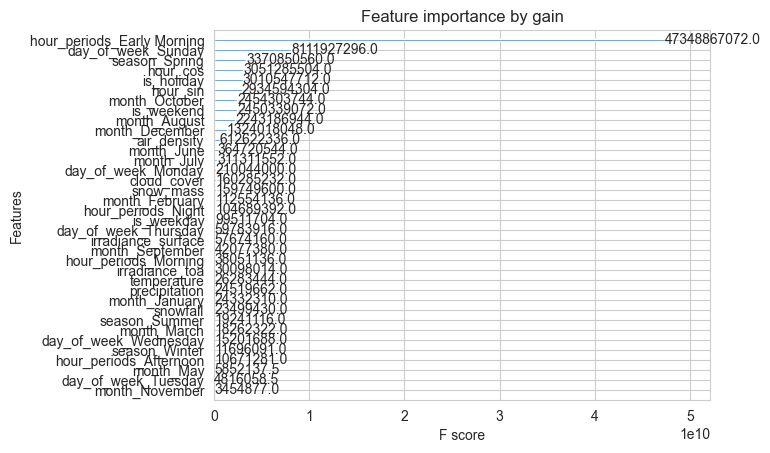

[I 2023-11-27 22:44:03,583] Trial 10 finished with value: 2567.882 and parameters: {'learning_rate': 0.1494994782819934, 'max_depth': 2, 'colsample_bytree': 0.9990113587721403, 'min_child_weight': 3}. Best is trial 10 with value: 2567.882.
[I 2023-11-27 22:44:25,919] Trial 11 finished with value: 2567.124 and parameters: {'learning_rate': 0.14908479395844682, 'max_depth': 2, 'colsample_bytree': 0.9977507883736081, 'min_child_weight': 3}. Best is trial 11 with value: 2567.124.
[I 2023-11-27 22:44:47,310] Trial 12 finished with value: 2576.632 and parameters: {'learning_rate': 0.14762259611488585, 'max_depth': 3, 'colsample_bytree': 0.9979239766785674, 'min_child_weight': 3}. Best is trial 11 with value: 2567.124.
[I 2023-11-27 22:45:07,027] Trial 13 finished with value: 2567.182 and parameters: {'learning_rate': 0.1474124199204022, 'max_depth': 2, 'colsample_bytree': 0.9969724447450476, 'min_child_weight': 3}. Best is trial 11 with value: 2567.124.
[I 2023-11-27 22:45:31,603] Trial 14 f

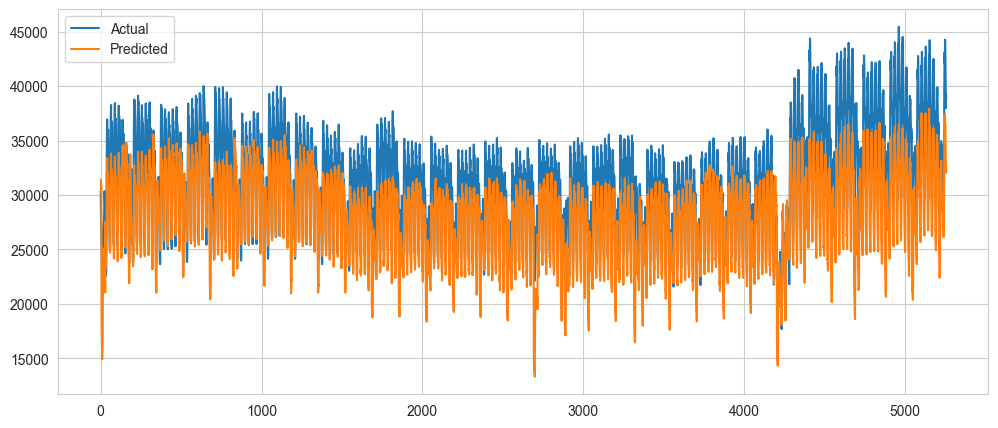

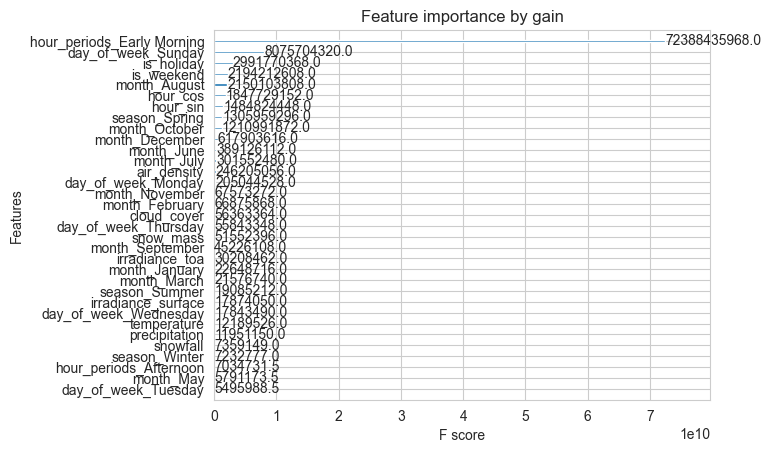

[I 2023-11-27 22:45:58,905] Trial 15 finished with value: 2584.3959999999997 and parameters: {'learning_rate': 0.10976153246160703, 'max_depth': 4, 'colsample_bytree': 0.9506253572732376, 'min_child_weight': 4}. Best is trial 11 with value: 2567.124.
[I 2023-11-27 22:46:22,123] Trial 16 finished with value: 2576.5780000000004 and parameters: {'learning_rate': 0.1492155953527059, 'max_depth': 3, 'colsample_bytree': 0.950235263005678, 'min_child_weight': 3}. Best is trial 11 with value: 2567.124.
[I 2023-11-27 22:46:44,676] Trial 17 finished with value: 2567.078 and parameters: {'learning_rate': 0.13453708611346, 'max_depth': 2, 'colsample_bytree': 0.9676524820836819, 'min_child_weight': 4}. Best is trial 17 with value: 2567.078.
[I 2023-11-27 22:47:13,577] Trial 18 finished with value: 2586.998 and parameters: {'learning_rate': 0.1332616099793702, 'max_depth': 4, 'colsample_bytree': 0.9598289671659535, 'min_child_weight': 4}. Best is trial 17 with value: 2567.078.
[I 2023-11-27 22:47:43

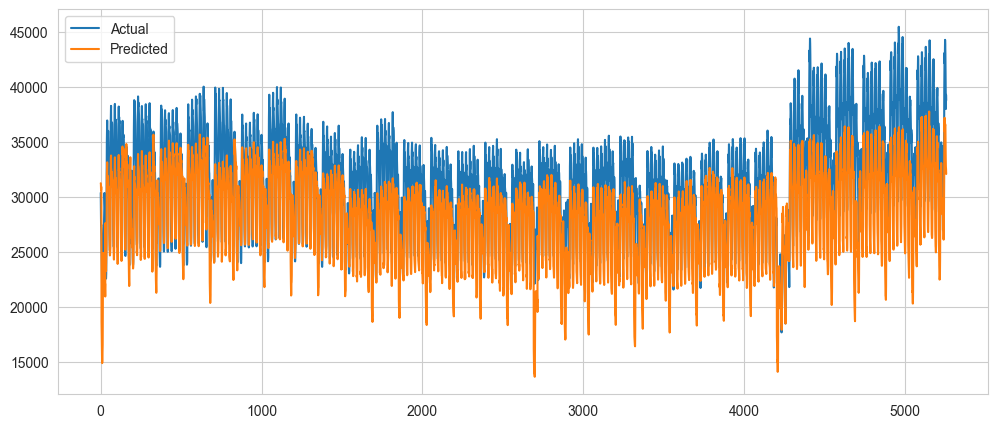

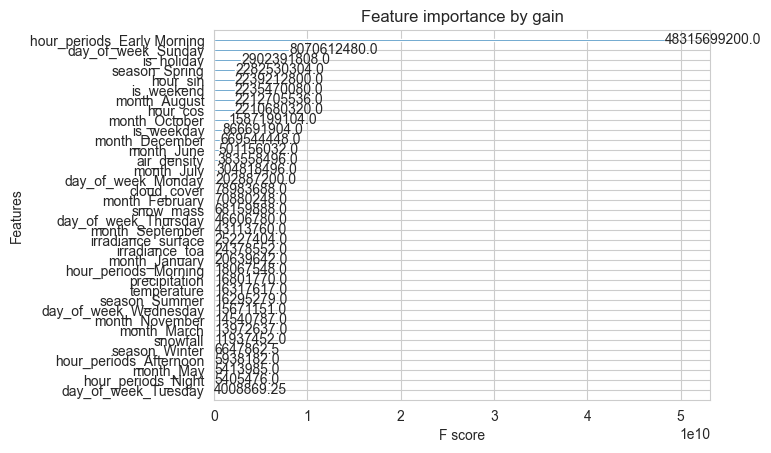

[I 2023-11-27 22:48:09,289] Trial 20 finished with value: 2574.792 and parameters: {'learning_rate': 0.13509937844528447, 'max_depth': 3, 'colsample_bytree': 0.8862009916027085, 'min_child_weight': 4}. Best is trial 17 with value: 2567.078.
[I 2023-11-27 22:48:30,722] Trial 21 finished with value: 2565.938 and parameters: {'learning_rate': 0.1383239738543783, 'max_depth': 2, 'colsample_bytree': 0.9992207330384609, 'min_child_weight': 3}. Best is trial 21 with value: 2565.938.
[I 2023-11-27 22:48:55,950] Trial 22 finished with value: 2567.9359999999997 and parameters: {'learning_rate': 0.13889512073914487, 'max_depth': 2, 'colsample_bytree': 0.9720066612473254, 'min_child_weight': 3}. Best is trial 21 with value: 2565.938.
[I 2023-11-27 22:49:17,936] Trial 23 finished with value: 2567.668 and parameters: {'learning_rate': 0.11756489394213215, 'max_depth': 2, 'colsample_bytree': 0.9408862769901702, 'min_child_weight': 4}. Best is trial 21 with value: 2565.938.
[I 2023-11-27 22:49:40,294]

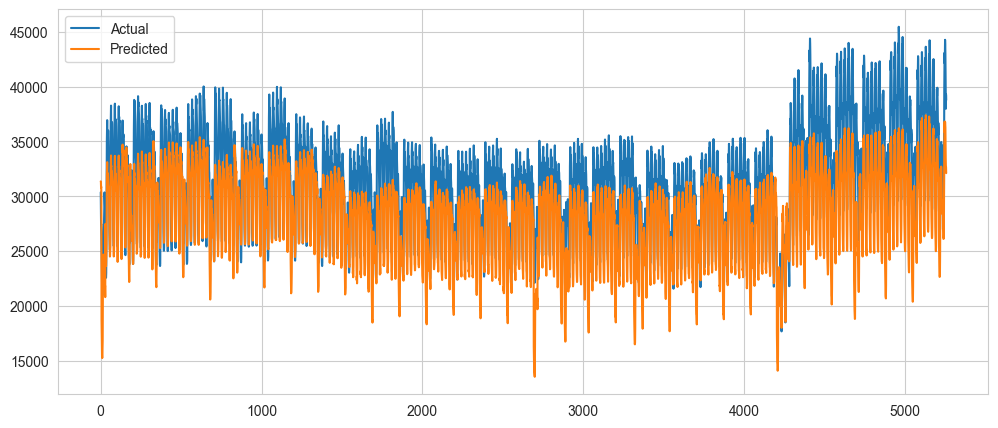

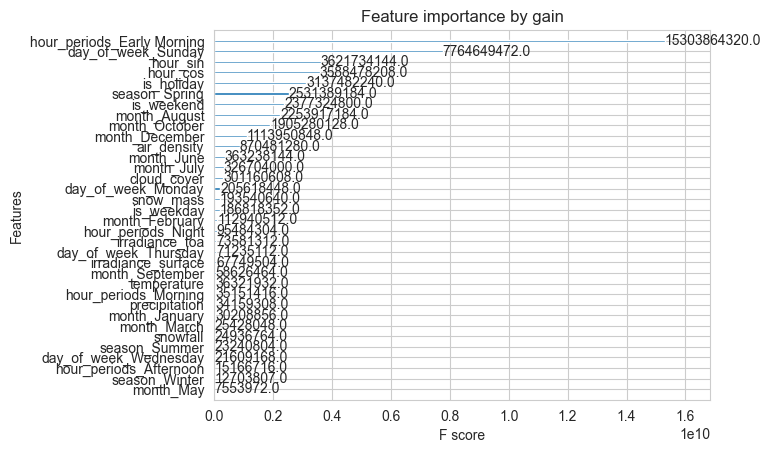

[I 2023-11-27 22:49:53,816] Trial 25 finished with value: 2566.482 and parameters: {'learning_rate': 0.11352021751599609, 'max_depth': 2, 'colsample_bytree': 0.9688442017106573, 'min_child_weight': 4}. Best is trial 21 with value: 2565.938.
[I 2023-11-27 22:50:06,814] Trial 26 finished with value: 2583.2519999999995 and parameters: {'learning_rate': 0.10777805586444536, 'max_depth': 4, 'colsample_bytree': 0.934745293615308, 'min_child_weight': 4}. Best is trial 21 with value: 2565.938.
[I 2023-11-27 22:50:19,525] Trial 27 finished with value: 2575.1879999999996 and parameters: {'learning_rate': 0.11962193739640725, 'max_depth': 3, 'colsample_bytree': 0.9685113294619372, 'min_child_weight': 6}. Best is trial 21 with value: 2565.938.
[I 2023-11-27 22:50:34,144] Trial 28 finished with value: 2568.018 and parameters: {'learning_rate': 0.10209429614753945, 'max_depth': 2, 'colsample_bytree': 0.9394054995953275, 'min_child_weight': 4}. Best is trial 21 with value: 2565.938.
[I 2023-11-27 22:

In [39]:
xgb_study = optuna.create_study(direction='minimize')
xgb_study.optimize(objective, n_trials=30)

In [65]:
print('Best hyperparameters:', xgb_study.best_params)
save_model(xgb_study.best_params, "../models/xgboost_study_params_2.pkl")
save_model(xgb_study, "../models/xgboost_study2.pkl")

Best hyperparameters: {'learning_rate': 0.1383239738543783, 'max_depth': 2, 'colsample_bytree': 0.9992207330384609, 'min_child_weight': 3}


In [66]:
# Static parameters
static_params = {
    "objective": "reg:squarederror",
    "n_estimators": 1000,
    "verbosity": 0,
    'interaction_constraints': [["hour_sin","hour_cos"]]
}

# Merge static parameters with the best parameters from the study
params = {**static_params, **xgb_study.best_params}


model = xgb.XGBRegressor(**params)
model.fit(train_x,train_y)

pred_y = model.predict(test_x)

print(pred_y)

# Calculate MAPE
mape = calculate_mape(test_y,pred_y)
print(f'MAPE: {mape.mean()}%')
# Calculate RMSE
rmse = calculate_RMSE(test_y,pred_y)
print(f'RMSE: {rmse}')

# Calculate MAE
mae = calculate_MAE(test_y,pred_y)
print(f'MAE: {mae}')

[33720.74  32698.656 31237.229 ... 27453.725 27482.04  26865.604]
MAPE: 8.74254420992584%
RMSE: 3173.19
MAE: 2811.66


## Post-Processing

After conducting numerous tests (not included here to keep the notebook concise), we concluded that our model is capable of capturing the data patterns effectively. However, it struggles to capture the high trend visible in the data.

To address this, we will apply a post-processing step to our model. Specifically, we will multiply predictions above 15,000k by a factor of 1.1. Additionally, for the winter season (December, January, and February), we will apply a further factor of 1.12 to the predictions above 15,000k. 

This is a simple post-processing technique. In a production setting, we would typically use more sophisticated methods, potentially incorporating indicators such as hour, season, etc., to adjust our predictions. However, for the purpose of this challenge, we will use this basic approach to showcase the concept of post-processing.

In [67]:
pred_y = post_process_predictions(predictions=pred_y,test_x=test_x ,threshold=15000, factor=1.1,winter_factor=1.12)

In [68]:
# Calculate MAPE
mape = calculate_mape(test_y,pred_y)
print(f'MAPE: {mape.mean()}%')
# Calculate RMSE
rmse = calculate_RMSE(test_y,pred_y)
print(f'RMSE: {rmse}')

# Calculate MAE
mae = calculate_MAE(test_y,pred_y)
print(f'MAE: {mae}')

MAPE: 4.4003907586993725%
RMSE: 1814.64
MAE: 1308.05


In [69]:
# we have significant improvement in our model performance after post processing

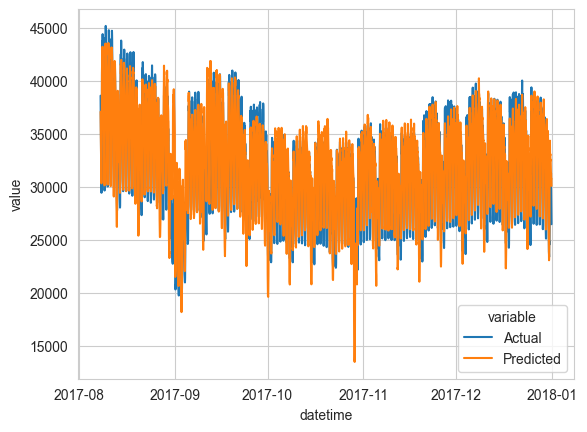

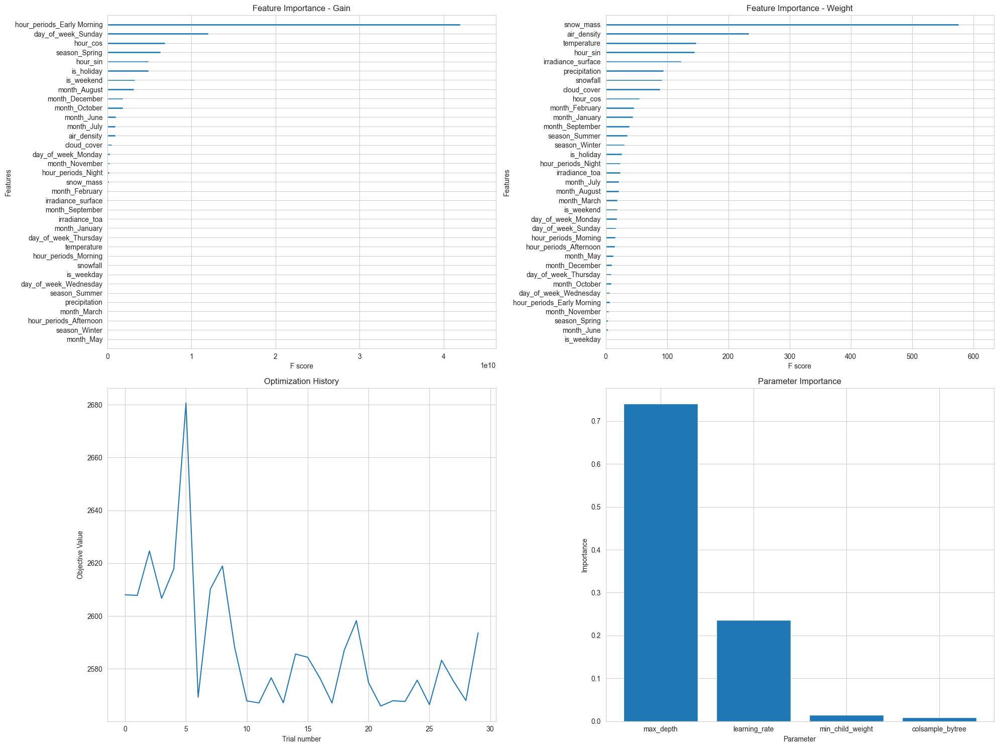

In [70]:
# Create a DataFrame for plotting
plot_df = pd.DataFrame({'Actual': test_y.values, 'Predicted': pred_y}, index=test_x.index)

# Reset index
plot_df_reset = plot_df.reset_index()

# Melt the DataFrame to have format suitable for seaborn
plot_df_melt = plot_df_reset.melt(id_vars=plot_df_reset.columns[0], value_vars=['Actual', 'Predicted'])

# Create the plot
sns.lineplot(data=plot_df_melt, x=plot_df_melt.columns[0], y='value', hue='variable')

plot_model_and_study(model, xgb_study)

In [71]:
# Define the pipeline
pipeline = Pipeline(steps=[
    ('datetime_feature_engineering', DateTimeFeatureEngineering()),
    ('hour_periods', HourPeriods()),
    ('add_holiday_column', AddHolidayColumn('Turkey')),
    ('drop_columns', DropColumns(['year'])),
    ('encode_cyclic_feature', EncodeCyclicFeature('hour', 23)),
    ('categorical_encoding', CategoricalEncoding(['month','hour_periods','day_of_week', 'season'])),
    ('ensure_season_columns', EnsureSeasonColumns()),
    ('ensure_month_columns', EnsureMonthColumns())

])


In [72]:
# train the model on the entire training set
model = xgb.XGBRegressor(**params)
train_y = baseline_train_df['demand']
train_x = pipeline.transform(baseline_train_df.drop(columns=['demand']))

model.fit(train_x, train_y)



XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9992207330384609, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=None, grow_policy=None,
             importance_type=None,
             interaction_constraints=[['hour_sin', 'hour_cos']],
             learning_rate=0.1383239738543783, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=2, max_leaves=None,
             min_child_weight=3, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [73]:
# transform the test set using the pipeline
test_set = pipeline.transform(test_df)

In [74]:
# Get the feature names from the trained model
feature_names = model.get_booster().feature_names

# Reorder the columns in the test set to match the order in the training set
test_set = test_set[feature_names]

pred_y  = model.predict(test_set)

pred_y = post_process_predictions(predictions=pred_y,test_x=test_set ,threshold=15000, factor=1.1,winter_factor=1.2)
test_df['demand'] = pred_y

test_df.to_csv('../result/test_predictions.csv')

## Further Considerations and Suggestions

- **Increase Trial Number**: With a powerful GPU, the training time would be lower, allowing for a higher number of trials. This would make the hyperparameter tuning process more efficient.

- **Experiment with Column Combinations**: Different combinations of columns could be used in trials to evaluate the model's efficiency and performance improvements.

- **Lag Values**: For day-ahead markets or similar, lag values can significantly improve the estimation accuracy using iterative predictions values.

- **Ensemble Models**: The use of ensemble models, such as boosting, can greatly improve the accuracy of the predictions.

- **Post-Processing**: Post-processing could be applied for each hour or each season, depending on the analysis of the predictions.

- **Algorithm Selection**: Different highly efficient algorithms like LightGBM could be compared with statistical models or tree-based models for ensemble usage.

- **Feature Engineering**: Depending on the region or city, more features could be added to the model.

- **Economic Factors**: Consideration of electricity prices or the economy could be added to the model for a more comprehensive prediction.